## An Introduction to Topological Data Analysis Ball Mapper in Python

This notebook accompanies the paper An Introduction to Topological Data Analysis Ball Mapper in Python (Rudkin, 2025). The code will create all of the figures within the guide and can be used as a base for applying Topological Data Anaysis Ball Mapper (TDABM) on any suitable dataset. 

The first step is the loading of the required packages, including the BallMapper package

In [1534]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import pyballmapper as pbm
import statistics
from itertools import combinations
from matplotlib.colors import ListedColormap
from matplotlib import colormaps as cm
import matplotlib.colors as mcolors

# Define fixed colors for each value from 1 to 8
colors = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3',
          '#ff7f00', '#ffff33',  '#a65628', '#f781bf']
cmap = mcolors.ListedColormap(colors)

# Create colormap and normalization
cmap = mcolors.ListedColormap(colors)
norm = mcolors.BoundaryNorm(boundaries=np.arange(0.5, 9.5, 1), ncolors=8)

# Define fixed colors for each value from 1 to 9
colors2 = ['#e41a1c', '#377eb8', '#4daf4a', '#984ea3',
          '#ff7f00', '#ffff33', '#008080','#a65628', '#f781bf']
cmap2 = mcolors.ListedColormap(colors2)

# Create colormap and normalization
cmap2 = mcolors.ListedColormap(colors2)
norm2 = mcolors.BoundaryNorm(boundaries=np.arange(0.5, 10.5, 1), ncolors=9)

I will create two datasets for this note. The first has 0 correlation between the two variables and the second has a correlation of 0.5. The datasets are called df1 and df2. The seed was selected because it creates a correlation of 0.497

In [1535]:
# Set seed for reproducibility
np.random.seed(101)

# Generate two independent uniform random variables
n = 1000
X1 = np.random.uniform(size=n)
X2 = np.random.uniform(size=n)

# Step 3: Create a correlated variable
# Standardize X1 and X2
X1_scaled = (X1 - np.mean(X1)) / np.std(X1)
X2_scaled = (X2 - np.mean(X2)) / np.std(X2)

# Dataset with 0 correlation by just using the two variables
df1=pd.DataFrame({
    'X1': X1_scaled,
    'X2': X2_scaled
})

# Create X2_adjusted to have a correlation of about 0.5 with X1
X2_adjusted = 0.5 * X1_scaled + np.sqrt(1 - 0.5**2) * X2_scaled

# Put into a DataFrame
df2 = pd.DataFrame({
    'X1': X1_scaled,
    'X2': X2_adjusted
})

# Check the correlation
print(df2.corr())


          X1        X2
X1  1.000000  0.495829
X2  0.495829  1.000000


It can be seen that the correlation between the two variables is 0.497. This is very close to the desired 0.500, hence I keep 101 as the random seeed. 

Next let us create scatter plots of the data without the outcome:

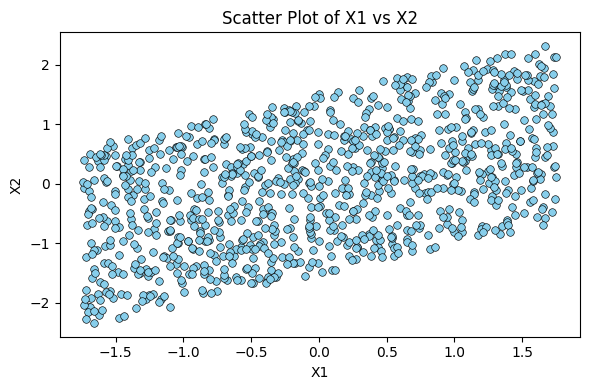

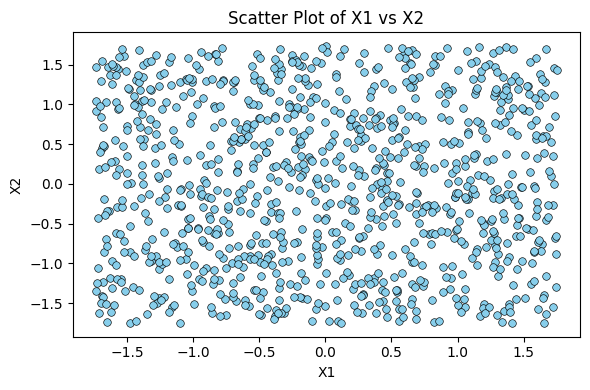

In [1536]:

# Create scatter plot
plt.figure(figsize=(6, 4))
sns.scatterplot(x='X1', y='X2', data=df2, s=30, color='skyblue', edgecolor='black')

# Add title and labels
plt.title('Scatter Plot of X1 vs X2')
plt.xlabel('X1')
plt.ylabel('X2')

# Show plot
plt.tight_layout()

plt.savefig('raw001p.png', dpi=300)
plt.show()

# Create scatter plot
plt.figure(figsize=(6, 4))
sns.scatterplot(x='X1', y='X2', data=df1, s=30, color='skyblue', edgecolor='black')

# Add title and labels
plt.title('Scatter Plot of X1 vs X2')
plt.xlabel('X1')
plt.ylabel('X2')

# Show plot
plt.tight_layout()


plt.savefig('raw002p.png', dpi=300)
plt.show()

I will now generate an outcome variable. The variable will be the difference between the two X variables

In [1537]:
df1['Y'] = df1['X1'] - df1['X2']
df2['Y'] = df2['X1'] - df2['X2']

I now create versions of the scatterplot colored by the Y variable, again the code creates two plots

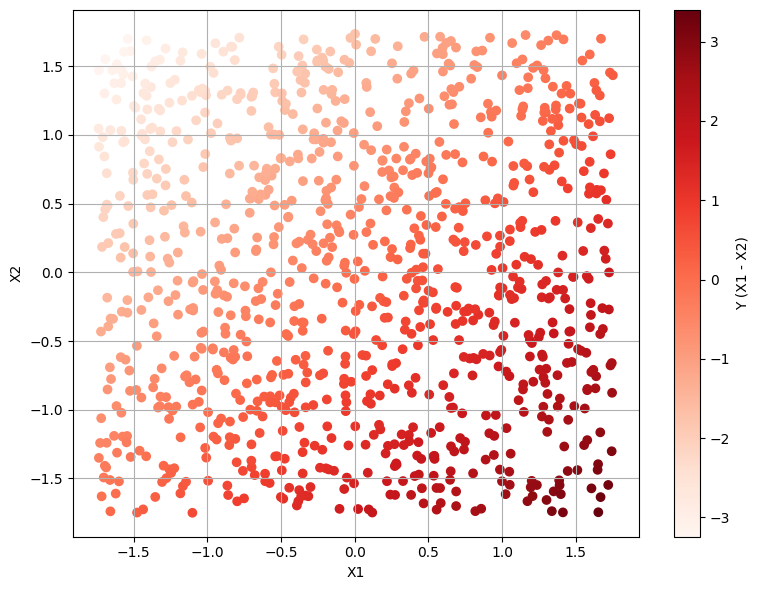

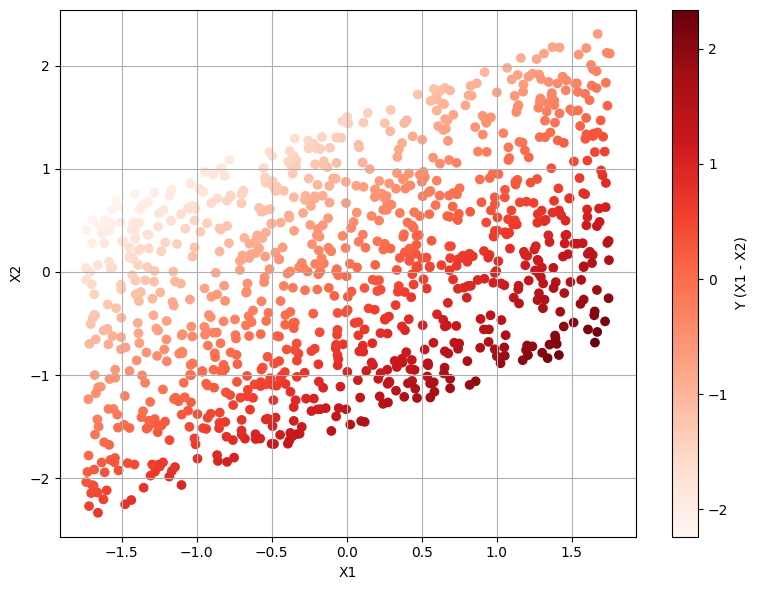

In [1538]:
plt.figure(figsize=(8, 6))
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['Y'], cmap='Reds')
plt.colorbar(scatter, label='Y (X1 - X2)')
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.grid(True)
plt.tight_layout()

plt.savefig('raw101.png', dpi=300)

plt.figure(figsize=(8, 6))
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['Y'], cmap='Reds')
plt.colorbar(scatter, label='Y (X1 - X2)')
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.grid(True)
plt.tight_layout()

plt.savefig('raw102.png', dpi=300)

The next two blocks of code produce the summary statistics. I format the output for inclusion within the guide

In [1539]:
df1.describe()

,X1,X2,Y
count,1.000000e+03,1.000000e+03,1.000000e+03
mean,-1.563194e-16,-1.030287e-16,-6.039613e-17
std,1.000500e+00,1.000500e+00,1.419446e+00
min,-1.738016e+00,-1.749409e+00,-3.243551e+00
25%,-8.330414e-01,-8.521919e-01,-9.888044e-01
50%,-2.808473e-02,-3.166929e-02,1.933567e-02
75%,8.440031e-01,8.589955e-01,1.026901e+00
max,1.753001e+00,1.734093e+00,3.399659e+00


In [1540]:
df2.describe()

,X1,X2,Y
count,1.000000e+03,1.000000e+03,1.000000e+03
mean,-1.563194e-16,-1.527667e-16,3.552714e-18
std,1.000500e+00,9.977210e-01,1.003272e+00
min,-1.738016e+00,-2.334987e+00,-2.240476e+00
25%,-8.330414e-01,-7.742629e-01,-7.607104e-01
50%,-2.808473e-02,5.076972e-02,9.348255e-03
75%,8.440031e-01,7.227390e-01,7.129131e-01
max,1.753001e+00,2.307972e+00,2.338708e+00


# Topological Data Analysis Ball Mapper Demonstration

Here I will create the first ball, selecting a point at random from the dataset. To ensure reproducability, the code first sets the random seed. The point is then selected at random from the data.

To identify the first random point from the first dataset, the value 101 is used. For the second dataset 201 is used.

In [1541]:
# Set seed for reproducibility
np.random.seed(123)

# 1. Choose a random point from the dataset
random_index101 = np.random.choice(df1.index)
random_point101 = df1.loc[random_index101]

random_index201 = np.random.choice(df2.index)
random_point201 = df2.loc[random_index201]

Next all the points within a fixed radius are identified. We use a radius of 1.5 in this example.

In [1542]:
radius = 1.5
df1['distance'] = np.sqrt((df1['X1'] - random_point101['X1'])**2 + (df1['X2'] - random_point101['X2'])**2)
df2['distance'] = np.sqrt((df2['X1'] - random_point201['X1'])**2 + (df2['X2'] - random_point201['X2'])**2)

Create a dummy which identifies all observations within the ball. One dummy is created in each dataset.

In [1543]:
df1['inside_circle01'] = (df1['distance'] <= radius).astype(int)
df2['inside_circle01'] = (df2['distance'] <= radius).astype(int)

df1['circle_membership'] = np.where(df1['inside_circle01'] == 1, 1, 8)
df2['circle_membership'] = np.where(df2['inside_circle01'] == 1, 1, 8)

The plotting code can now be run for each of the two datasets. 

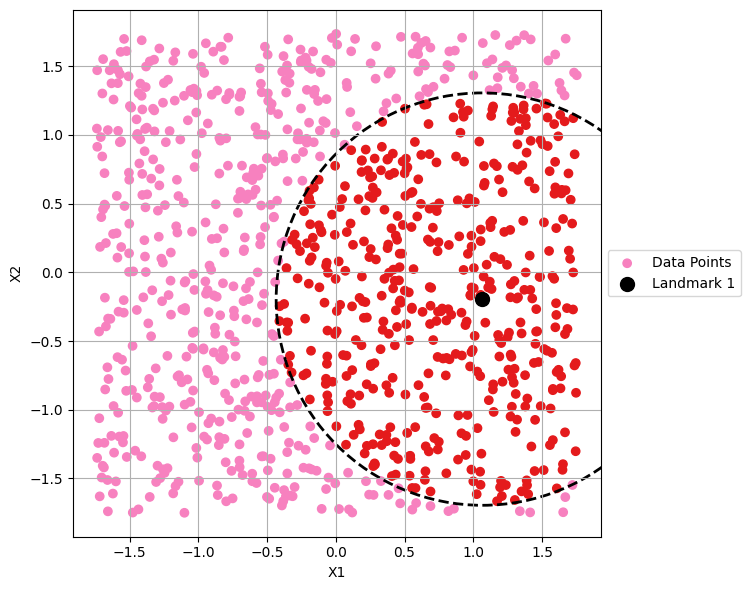

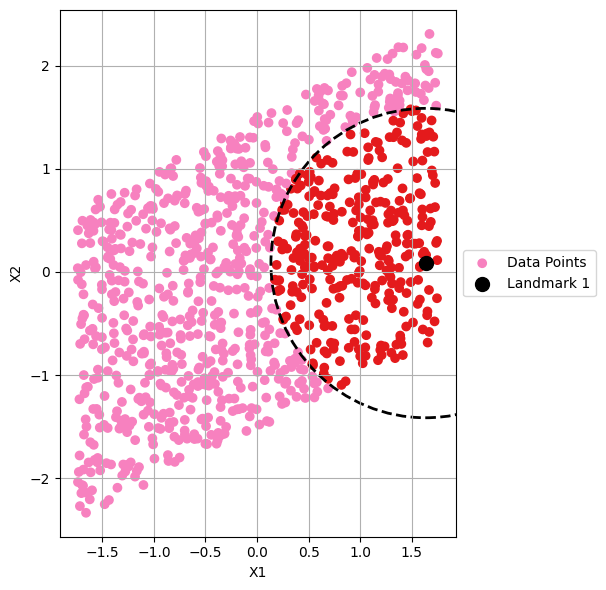

In [1544]:
plt.figure(figsize=(8, 6))
plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap=cmap, norm=norm, label="Data Points")
plt.scatter(random_point101['X1'], random_point101['X2'], color='black', label="Landmark 1", s=100)
circle = plt.Circle((random_point101['X1'], random_point101['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle)
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.tight_layout()
plt.savefig('rawd1p01.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

plt.figure(figsize=(8, 6))
plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap=cmap, norm=norm, label="Data Points")
plt.scatter(random_point201['X1'], random_point201['X2'], color='black', label="Landmark 1", s=100)
circle = plt.Circle((random_point201['X1'], random_point201['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle)
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.tight_layout()
plt.savefig('rawd2p01.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

The first ball is now represented on the scatter plots. Next a point should be chosen at random from the set of points which has not been covered

In [1545]:
# First, identify points not inside the first circle
not_in_first_circle1 = df1[df1['inside_circle01'] == 0]
not_in_first_circle2 = df2[df2['inside_circle01'] == 0]

# Randomly select a point from those not in the first circle
second_random_index1 = np.random.choice(not_in_first_circle1.index)
second_random_index2 = np.random.choice(not_in_first_circle2.index)
random_point102 = df1.loc[second_random_index1]
random_point202 = df2.loc[second_random_index2]

The next step is the construction of the second circle around the points

In [1546]:
df1['distance'] = np.sqrt((df1['X1'] - random_point102['X1'])**2 + (df1['X2'] - random_point102['X2'])**2)
df2['distance'] = np.sqrt((df2['X1'] - random_point202['X1'])**2 + (df2['X2'] - random_point202['X2'])**2)


Create a dummy for points being in the second circle

In [1547]:
df1['inside_circle02'] = (df1['distance'] <= radius).astype(int)
df2['inside_circle02'] = (df2['distance'] <= radius).astype(int)

Some points may appear in both circles. Meanwhile there may still be points which do not appear in either 1 or 2.

A circle membership variable is created to help with coloring. This pattern is repeated in later balls.

In [1548]:
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 0), 'circle_membership'] = 1
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle01'] == 0), 'circle_membership'] = 2
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0), 'circle_membership'] = 8

df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 0), 'circle_membership'] = 1
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle01'] == 0), 'circle_membership'] = 2
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0), 'circle_membership'] = 8

Now let us plot the two balls to show the TDABM plot starting to form.

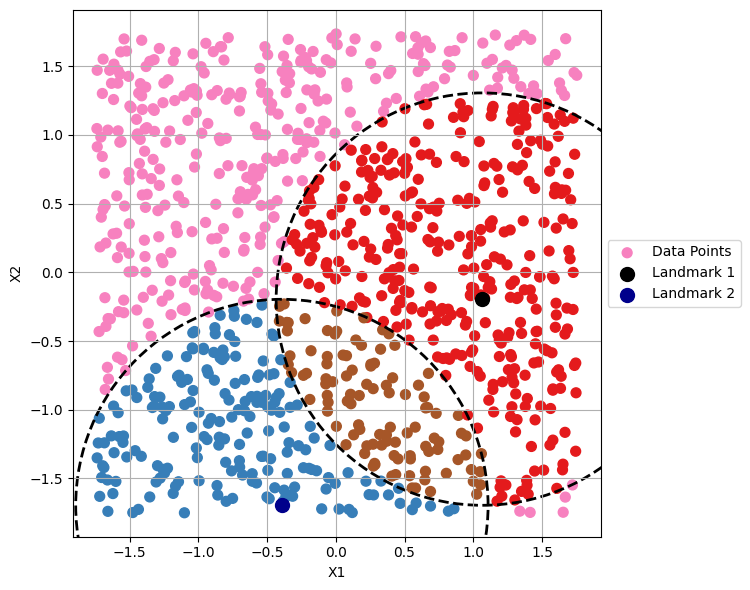

In [1549]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(random_point101['X1'], random_point101['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point101['X1'], random_point101['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point102['X1'], random_point102['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point102['X1'], random_point102['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd1p02.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

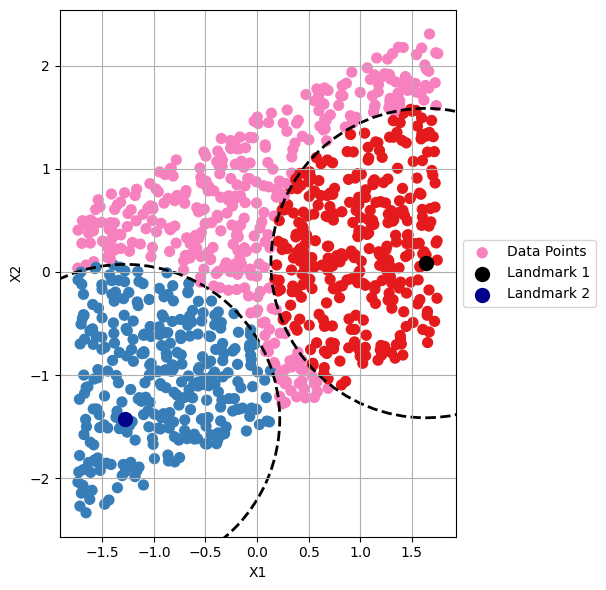

In [1550]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
color_map = {1: 'red', 2: 'blue', 3: 'purple', 0: 'gray'}
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(random_point201['X1'], random_point201['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point201['X1'], random_point201['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point202['X1'], random_point202['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point202['X1'], random_point202['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd2p02.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

For the second dataset, there is an area of uncovered points to the lower left. 

The next step is to choose a third point from those which are not yet in a circle

In [1551]:
not_in_any_circle1 = df1[df1['circle_membership'] == 8]
not_in_any_circle2 = df2[df2['circle_membership'] == 8]

Now randomly select the points

In [1552]:
third_random_index1 = np.random.choice(not_in_any_circle1.index)
third_random_index2 = np.random.choice(not_in_any_circle2.index)
random_point103 = df1.loc[third_random_index1]
random_point203 = df2.loc[third_random_index2]

Now generate the distances and find the ball (circle)

In [1553]:
df1['distance_third_circle'] = np.sqrt((df1['X1'] - random_point103['X1'])**2 + (df1['X2'] - random_point103['X2'])**2)
df2['distance_third_circle'] = np.sqrt((df2['X1'] - random_point203['X1'])**2 + (df2['X2'] - random_point203['X2'])**2)

# Add dummy variable 'inside_third_circle' (1 if within third circle, else 0)
df1['inside_circle03'] = (df1['distance_third_circle'] <= radius).astype(int)
df2['inside_circle03'] = (df2['distance_third_circle'] <= radius).astype(int)



Update the circle membership variable to understand which points are in each ball.

In [1554]:
# Update circle_membership based on new conditions (Dataset 1)

df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0), 'circle_membership'] = 1
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle01'] == 0) & (df1['inside_circle03'] == 0), 'circle_membership'] = 2
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0), 'circle_membership'] = 3

# Points inside two or more circles
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7

# Points inside none of the circles
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0), 'circle_membership'] = 8

# Update circle_membership based on new conditions (Dataset 2)

df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0), 'circle_membership'] = 1
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle01'] == 0) & (df2['inside_circle03'] == 0), 'circle_membership'] = 2
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0), 'circle_membership'] = 3

# Points inside two or more circles
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7

# Points inside none of the circles
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0), 'circle_membership'] = 8

Generate the plots for each dataset

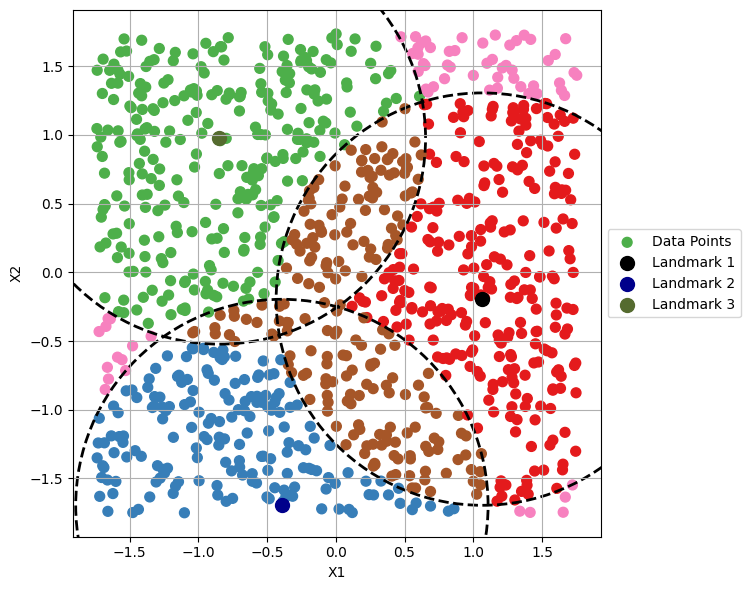

In [1555]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point101['X1'], random_point101['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point101['X1'], random_point101['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point102['X1'], random_point102['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point102['X1'], random_point102['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point103['X1'], random_point103['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point103['X1'], random_point103['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd1p03.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

There are three areas of uncovered points. One sits to the lower centre-left, one sits to the upper right, and one sits to the bottom right

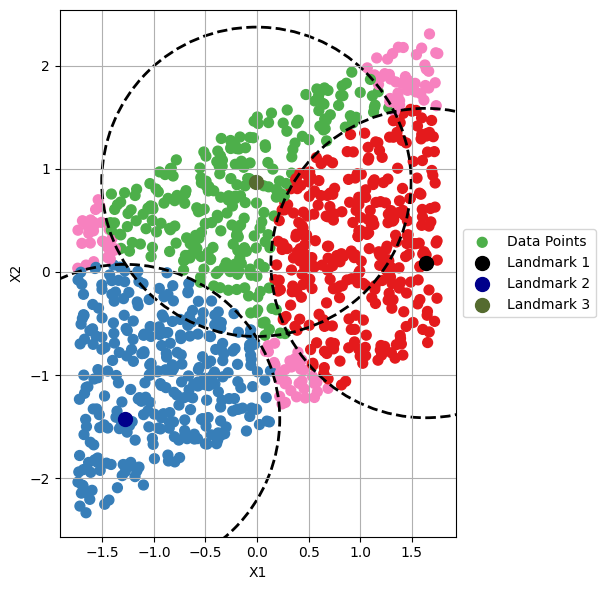

In [1556]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point201['X1'], random_point201['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point201['X1'], random_point201['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point202['X1'], random_point202['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point202['X1'], random_point202['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point203['X1'], random_point203['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point203['X1'], random_point203['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd2p03.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

Here there are three pockets of points in the dataset that are not covered. 

The process remains the same. A 4th uncovered point must now be selected

In [1557]:
not_in_any_circle1 = df1[df1['circle_membership'] == 8]
not_in_any_circle2 = df2[df2['circle_membership'] == 8]

Select a random point

In [1558]:
second_random_index1 = np.random.choice(not_in_any_circle1.index)
second_random_index2 = np.random.choice(not_in_any_circle2.index)
random_point104 = df1.loc[second_random_index1]
random_point204 = df2.loc[second_random_index2]

Identify the points within the radius of the fourth circle

In [1559]:
df1['distance_fourth_circle'] = np.sqrt((df1['X1'] - random_point104['X1'])**2 + (df1['X2'] - random_point104['X2'])**2)
df2['distance_fourth_circle'] = np.sqrt((df2['X1'] - random_point204['X1'])**2 + (df2['X2'] - random_point204['X2'])**2)

# Add dummy variable 'inside_third_circle' (1 if within third circle, else 0)
df1['inside_circle04'] = (df1['distance_fourth_circle'] <= radius).astype(int)
df2['inside_circle04'] = (df2['distance_fourth_circle'] <= radius).astype(int)

Continue to update the circle_membership variable to show which points are in the balls that have been formed

In [1560]:
# Update circle_membership based on new conditions (Dataset 1)

df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0), 'circle_membership'] = 1
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0), 'circle_membership'] = 2
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 1) & (df1['inside_circle04'] == 0), 'circle_membership'] = 3
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 1), 'circle_membership'] = 4

# Points inside two circles
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7

# Points inside none of the circles
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0), 'circle_membership'] = 8

# Update circle_membership based on new conditions (Dataset 2)

df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0), 'circle_membership'] = 1
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 1) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0), 'circle_membership'] = 2
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 1) & (df2['inside_circle04'] == 0), 'circle_membership'] = 3
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 1), 'circle_membership'] = 4

# Points inside two circles
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle03'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle03'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7

# Points inside none of the circles
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0), 'circle_membership'] = 8


Plot the first dataset

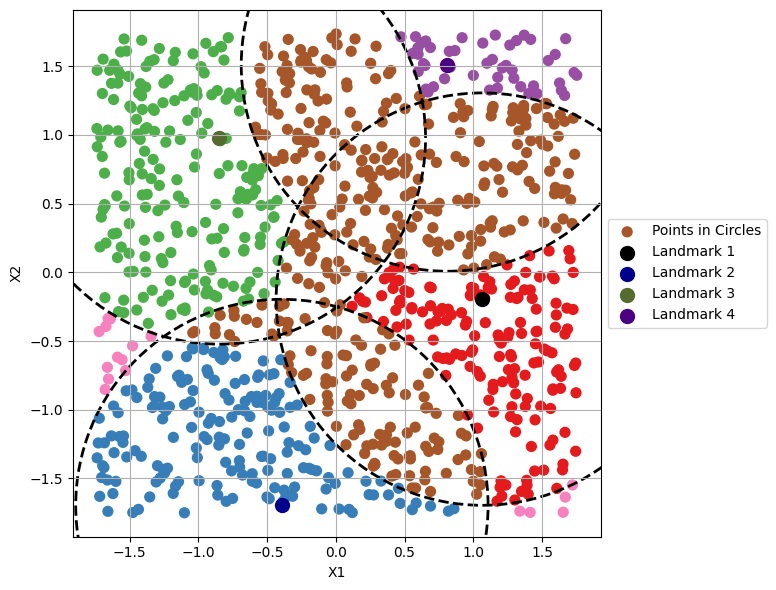

In [1561]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap=cmap, norm=norm, label="Points in Circles", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point101['X1'], random_point101['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point101['X1'], random_point101['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point102['X1'], random_point102['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point102['X1'], random_point102['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the second random point
plt.scatter(random_point103['X1'], random_point103['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((random_point103['X1'], random_point103['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the second random point
plt.scatter(random_point104['X1'], random_point104['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the second circle around the second random point
circle4 = plt.Circle((random_point104['X1'], random_point104['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd1p04.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

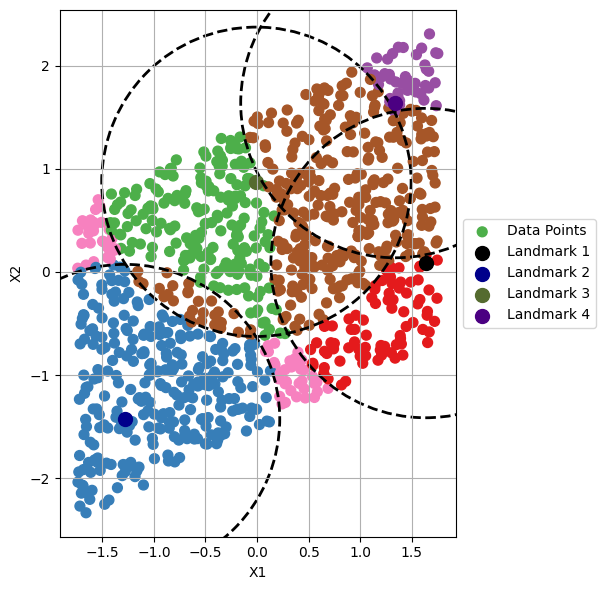

In [1562]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point201['X1'], random_point201['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point201['X1'], random_point201['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point202['X1'], random_point202['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point202['X1'], random_point202['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point203['X1'], random_point203['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point203['X1'], random_point203['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(random_point204['X1'], random_point204['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the fourth random point
circle4 = plt.Circle((random_point204['X1'], random_point204['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd2p04.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

There are still two pockets of pink data points in both plots. Landmark 5 will be used to create a cover for one of the two pockets

In [1563]:
not_in_any_circle1 = df1[df1['circle_membership'] == 8]
not_in_any_circle2 = df2[df2['circle_membership'] == 8]

A random point is selected from each of the datasets

In [1564]:
fifth_random_index1 = np.random.choice(not_in_any_circle1.index)
fifth_random_index2 = np.random.choice(not_in_any_circle2.index)
random_point105 = df1.loc[fifth_random_index1]
random_point205 = df2.loc[fifth_random_index2]

Now the circles around the selected points are drawn

In [1565]:
df1['distance_fifth_circle'] = np.sqrt((df1['X1'] - random_point105['X1'])**2 + (df1['X2'] - random_point105['X2'])**2)
df2['distance_fifth_circle'] = np.sqrt((df2['X1'] - random_point205['X1'])**2 + (df2['X2'] - random_point205['X2'])**2)

# Add dummy variable 'inside_third_circle' (1 if within third circle, else 0)
df1['inside_circle05'] = (df1['distance_fifth_circle'] <= radius).astype(int)
df2['inside_circle05'] = (df2['distance_fifth_circle'] <= radius).astype(int)

The ball membership is now updated with the impact of the 5th ball

In [1566]:
# Update circle_membership based on new conditions (Dataset 1)

df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0), 'circle_membership'] = 1
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0), 'circle_membership'] = 2
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 1) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0), 'circle_membership'] = 3
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 1) & (df1['inside_circle05'] == 0), 'circle_membership'] = 4
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 1), 'circle_membership'] = 5

# Points inside two circles
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle04'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7

# Points which are uncovered
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0), 'circle_membership'] = 8

# Update circle_membership based on new conditions (Dataset 2)

df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0), 'circle_membership'] = 1
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 1) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0), 'circle_membership'] = 2
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 1) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0), 'circle_membership'] = 3
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 1) & (df2['inside_circle05'] == 0), 'circle_membership'] = 4
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 1), 'circle_membership'] = 5

# Points inside two circles
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle03'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle03'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle04'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7

# Points which are uncovered
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0), 'circle_membership'] = 8

The plots can now be generated

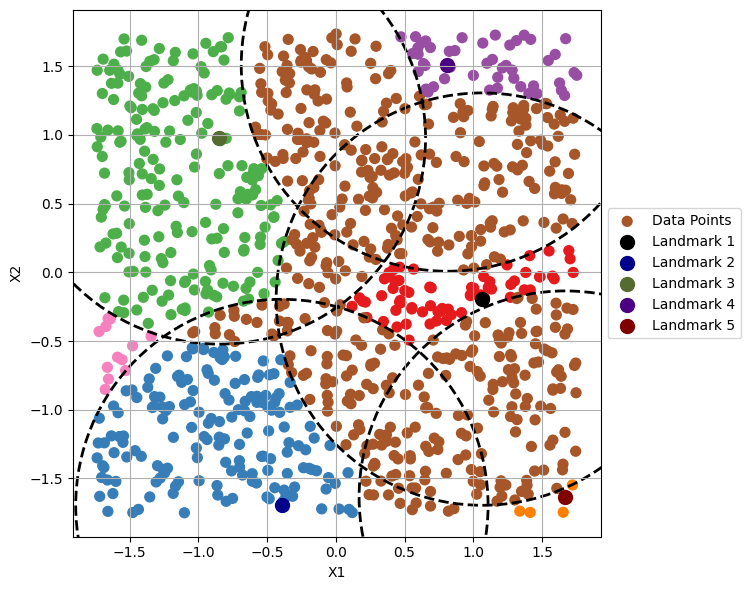

In [1567]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point101['X1'], random_point101['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point101['X1'], random_point101['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point102['X1'], random_point102['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point102['X1'], random_point102['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point103['X1'], random_point103['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point103['X1'], random_point103['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(random_point104['X1'], random_point104['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the fourth random point
circle4 = plt.Circle((random_point104['X1'], random_point104['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(random_point105['X1'], random_point105['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the fifth random point
circle5 = plt.Circle((random_point105['X1'], random_point105['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd1p05.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

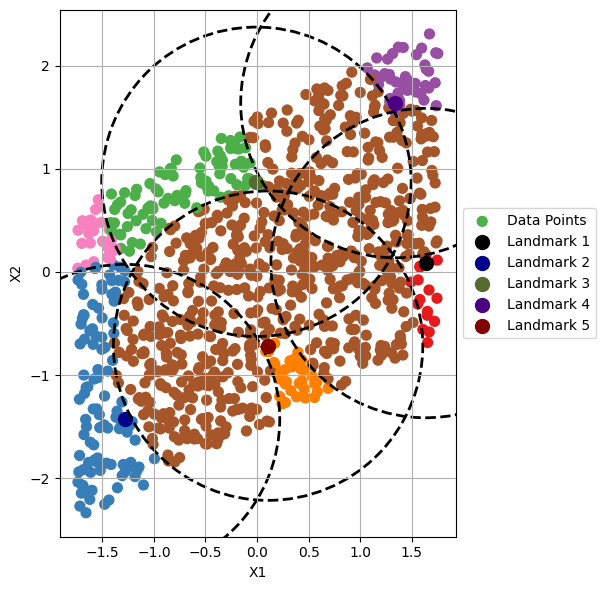

In [1568]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point201['X1'], random_point201['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point201['X1'], random_point201['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point202['X1'], random_point202['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point202['X1'], random_point202['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point203['X1'], random_point203['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point203['X1'], random_point203['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(random_point204['X1'], random_point204['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the second circle around the second random point
circle4 = plt.Circle((random_point204['X1'], random_point204['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(random_point205['X1'], random_point205['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the fifth random point
circle5 = plt.Circle((random_point205['X1'], random_point205['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd2p05.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

Both datasets still have uncovered points. The next step is to work on Ball 6


In [1569]:
not_in_any_circle1 = df1[df1['circle_membership'] == 8]
not_in_any_circle2 = df2[df2['circle_membership'] == 8]

Now identify the random point

In [1570]:
sixth_random_index1 = np.random.choice(not_in_any_circle1.index)
sixth_random_index2 = np.random.choice(not_in_any_circle2.index)
random_point106 = df1.loc[sixth_random_index1]
random_point206 = df2.loc[sixth_random_index2]

Create the circle and check membership

In [1571]:
df1['distance_sixth_circle'] = np.sqrt((df1['X1'] - random_point106['X1'])**2 + (df1['X2'] - random_point106['X2'])**2)
df2['distance_sixth_circle'] = np.sqrt((df2['X1'] - random_point206['X1'])**2 + (df2['X2'] - random_point206['X2'])**2)

# Add dummy variable 'inside_third_circle' (1 if within third circle, else 0)
df1['inside_circle06'] = (df1['distance_sixth_circle'] <= radius).astype(int)
df2['inside_circle06'] = (df2['distance_sixth_circle'] <= radius).astype(int)


The next step is to update the circle membership variable

In [1572]:
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0) & (df1['inside_circle06'] == 0), 'circle_membership'] = 1
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0) & (df1['inside_circle06'] == 0), 'circle_membership'] = 2
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 1) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0) & (df1['inside_circle06'] == 0), 'circle_membership'] = 3
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 1) & (df1['inside_circle05'] == 0) & (df1['inside_circle06'] == 0), 'circle_membership'] = 4
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 1) & (df1['inside_circle06'] == 0), 'circle_membership'] = 5
df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0) & (df1['inside_circle06'] == 1), 'circle_membership'] = 6

# Points inside two circles
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle02'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle01'] == 1) & (df1['inside_circle06'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle03'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle02'] == 1) & (df1['inside_circle06'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle04'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle03'] == 1) & (df1['inside_circle06'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle04'] == 1) & (df1['inside_circle05'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle04'] == 1) & (df1['inside_circle06'] == 1), 'circle_membership'] = 7
df1.loc[(df1['inside_circle05'] == 1) & (df1['inside_circle06'] == 1), 'circle_membership'] = 7

# Note there is no need to consider 5 or 6 so straight to 0

df1.loc[(df1['inside_circle01'] == 0) & (df1['inside_circle02'] == 0) & (df1['inside_circle03'] == 0) & (df1['inside_circle04'] == 0) & (df1['inside_circle05'] == 0) & (df1['inside_circle06'] == 0), 'circle_membership'] = 0

# Repeat for dataset 2

df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0) & (df2['inside_circle06'] == 0), 'circle_membership'] = 1
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 1) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0) & (df2['inside_circle06'] == 0), 'circle_membership'] = 2
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 1) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0) & (df2['inside_circle06'] == 0), 'circle_membership'] = 3
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 1) & (df2['inside_circle05'] == 0) & (df2['inside_circle06'] == 0), 'circle_membership'] = 4
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 1) & (df2['inside_circle06'] == 0), 'circle_membership'] = 5
df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0) & (df2['inside_circle06'] == 1), 'circle_membership'] = 6

# Points inside two circles
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle02'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle03'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle01'] == 1) & (df2['inside_circle06'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle03'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle02'] == 1) & (df2['inside_circle06'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle04'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle03'] == 1) & (df2['inside_circle06'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle04'] == 1) & (df2['inside_circle05'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle04'] == 1) & (df2['inside_circle06'] == 1), 'circle_membership'] = 7
df2.loc[(df2['inside_circle05'] == 1) & (df2['inside_circle06'] == 1), 'circle_membership'] = 7

# Note there is no need to consider 5 or 6 so straight to 0

df2.loc[(df2['inside_circle01'] == 0) & (df2['inside_circle02'] == 0) & (df2['inside_circle03'] == 0) & (df2['inside_circle04'] == 0) & (df2['inside_circle05'] == 0) & (df2['inside_circle06'] == 0), 'circle_membership'] = 0


Now generate the plot for the first dataset

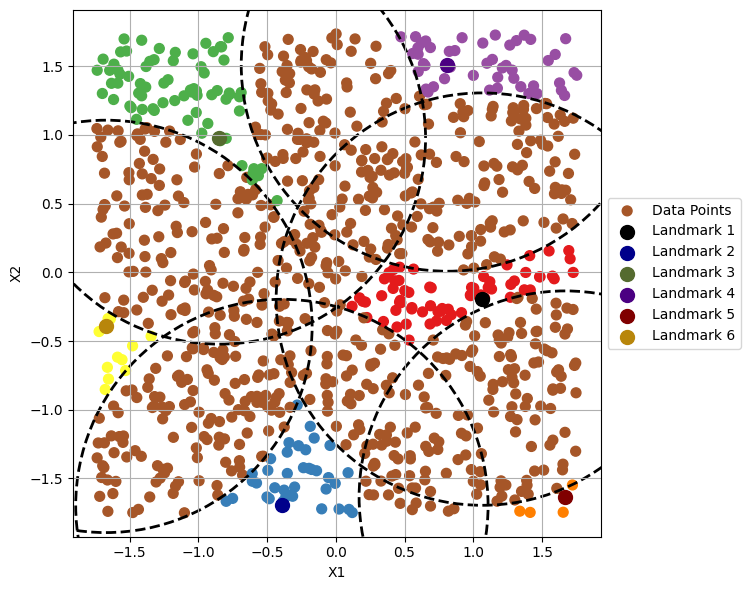

In [1573]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point101['X1'], random_point101['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point101['X1'], random_point101['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point102['X1'], random_point102['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point102['X1'], random_point102['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point103['X1'], random_point103['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point103['X1'], random_point103['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(random_point104['X1'], random_point104['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the fourth random point
circle4 = plt.Circle((random_point104['X1'], random_point104['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(random_point105['X1'], random_point105['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the fifth random point
circle5 = plt.Circle((random_point105['X1'], random_point105['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Highlight the sixth random point
plt.scatter(random_point106['X1'], random_point106['X2'], color='darkgoldenrod', label="Landmark 6", s=100)

# Draw the fifth circle around the sixth random point
circle6 = plt.Circle((random_point106['X1'], random_point106['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle6)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd1p06.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

And for Dataset 2

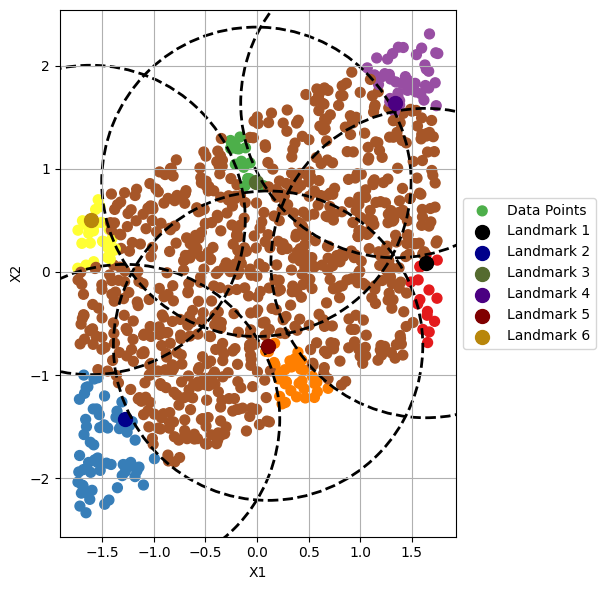

In [1574]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap=cmap, norm=norm, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point (Circle 1)
plt.scatter(random_point201['X1'], random_point201['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((random_point201['X1'], random_point201['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(random_point202['X1'], random_point202['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((random_point202['X1'], random_point202['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(random_point203['X1'], random_point203['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the third random point
circle3 = plt.Circle((random_point203['X1'], random_point203['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(random_point204['X1'], random_point204['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the second circle around the second random point
circle4 = plt.Circle((random_point204['X1'], random_point204['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(random_point205['X1'], random_point205['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the fifth random point
circle5 = plt.Circle((random_point205['X1'], random_point205['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Highlight the sixth random point
plt.scatter(random_point206['X1'], random_point206['X2'], color='darkgoldenrod', label="Landmark 6", s=100)

# Draw the sixth circle around the sixth random point
circle6 = plt.Circle((random_point206['X1'], random_point206['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle6)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('rawd2p06.png', dpi=300, bbox_inches='tight', pad_inches=0.1)

All of the data points are now covered in both datasets. This is the point at which the formatting of the TDABM plot can be considered

Create a DataFrame object with the centres of the circles

In [1575]:
point_names = [
    random_point101, random_point102, random_point103, 
    random_point104, random_point105, random_point106
]

data = []
for i, point in enumerate(point_names, start=1):
    # Extract X1 and X2 from the point's dictionary
    x1 = point['X1']
    x2 = point['X2']
    # Append to the DataFrame data
    data.append({
        'circle_number': i,  # e.g., random_point103 → circle 3
        'X1': x1,
        'X2': x2
    })

centers_df1 = pd.DataFrame(data)

Identify the centres of the circles. Here as a list and a data frame object

In [1576]:
centers_df1["circle_id"] = centers_df1["circle_number"].apply(lambda x: f"circle{x:02d}")
circle_centers1 = centers_df1.set_index("circle_id")[["X1", "X2"]].to_dict(orient="index")

This block of code will identify the existence of points in the intersection of circles. Here the code uses the inside_circleXX form to identify non-empty intersections

In [1577]:
# Generate all circle pairs (e.g., ["circle01", "circle02"], ["circle01", "circle03"], ...)
circle_ids1 = [f"circle{i:02d}" for i in centers_df1["circle_number"]]
circle_pairs1 = list(combinations(circle_ids1, 2))

# Find intersecting pairs
intersecting_pairs1 = []
for circle1, circle2 in circle_pairs1:
    col1 = f"inside_{circle1}"  # e.g., "inside_circle01"
    col2 = f"inside_{circle2}"  # e.g., "inside_circle02"
    
    if (df1[col1] & df1[col2]).any():
        intersecting_pairs1.append((circle1, circle2))

The code must be repeated for the second data set

In [1578]:
point_names = [
    random_point201, random_point202, random_point203, 
    random_point204, random_point205, random_point206
]

data = []
for i, point in enumerate(point_names, start=1):
    # Extract X1 and X2 from the point's dictionary
    x1 = point['X1']
    x2 = point['X2']
    # Append to the DataFrame data
    data.append({
        'circle_number': i,  # e.g., random_point103 → circle 3
        'X1': x1,
        'X2': x2
    })

centers_df2 = pd.DataFrame(data)

centers_df2["circle_id"] = centers_df2["circle_number"].apply(lambda x: f"circle{x:02d}")
circle_centers2 = centers_df2.set_index("circle_id")[["X1", "X2"]].to_dict(orient="index")

# Generate all circle pairs (e.g., ["circle01", "circle02"], ["circle01", "circle03"], ...)
circle_ids2 = [f"circle{i:02d}" for i in centers_df2["circle_number"]]
circle_pairs2 = list(combinations(circle_ids2, 2))

# Find intersecting pairs
intersecting_pairs2 = []
for circle1, circle2 in circle_pairs2:
    col1 = f"inside_{circle1}"  # e.g., "inside_circle01"
    col2 = f"inside_{circle2}"  # e.g., "inside_circle02"
    
    if (df2[col1] & df2[col2]).any():
        intersecting_pairs2.append((circle1, circle2))



Create the plot with network for the uncorrelated dataset

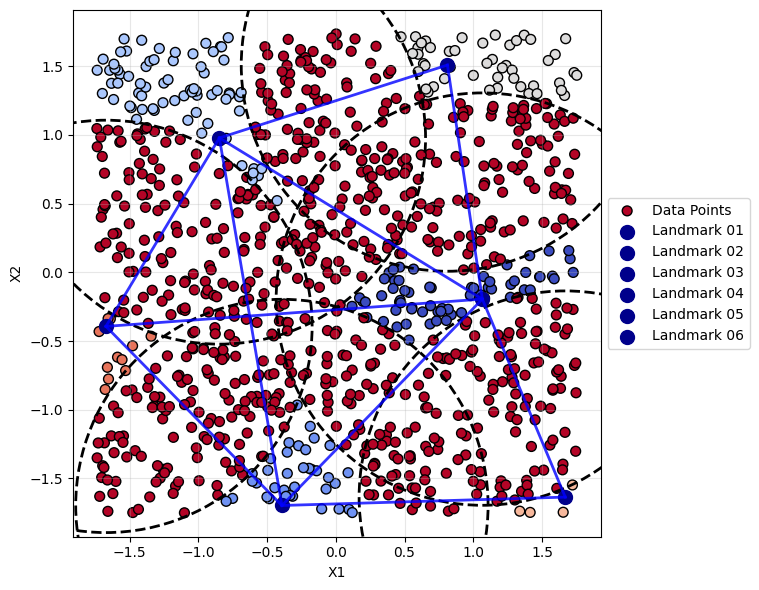

In [1579]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membership'], cmap='coolwarm', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centers1 = {
    'circle01': (random_point101['X1'], random_point101['X2']),
    'circle02': (random_point102['X1'], random_point102['X2']),
    'circle03': (random_point103['X1'], random_point103['X2']),
    'circle04': (random_point104['X1'], random_point104['X2']),
    'circle05': (random_point105['X1'], random_point105['X2']),
    'circle06': (random_point106['X1'], random_point106['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centers1.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs1 = list(combinations(circle_centers1.keys(), 2))
for circle1, circle2 in circle_pairs1:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centers1[circle1]
        x2, y2 = circle_centers1[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd1p07.png', dpi=300)

The blue lines connect the balls with non-empty intersections.

The plotting code is repeated for the second dataset

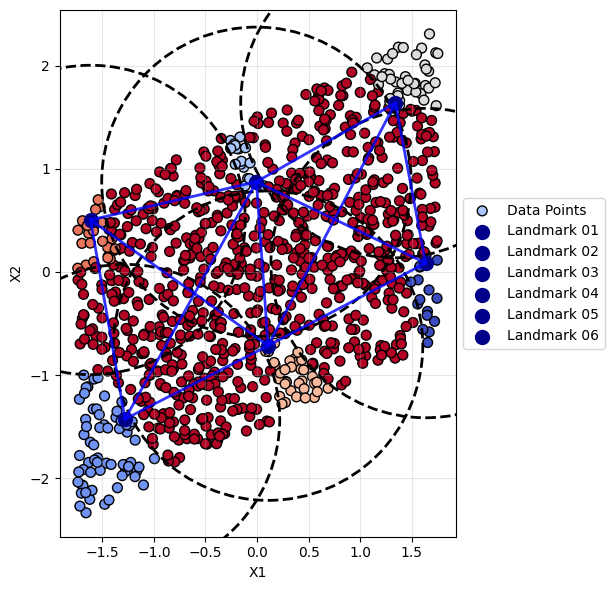

In [1580]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membership'], cmap='coolwarm', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centers2 = {
    'circle01': (random_point201['X1'], random_point201['X2']),
    'circle02': (random_point202['X1'], random_point202['X2']),
    'circle03': (random_point203['X1'], random_point203['X2']),
    'circle04': (random_point204['X1'], random_point204['X2']),
    'circle05': (random_point205['X1'], random_point205['X2']),
    'circle06': (random_point206['X1'], random_point206['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centers2.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs2 = list(combinations(circle_centers2.keys(), 2))
for circle1, circle2 in circle_pairs2:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centers2[circle1]
        x2, y2 = circle_centers2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd2p07.png', dpi=300)

It is straightforward now to replace the ball membership colouration with the Y value colouration

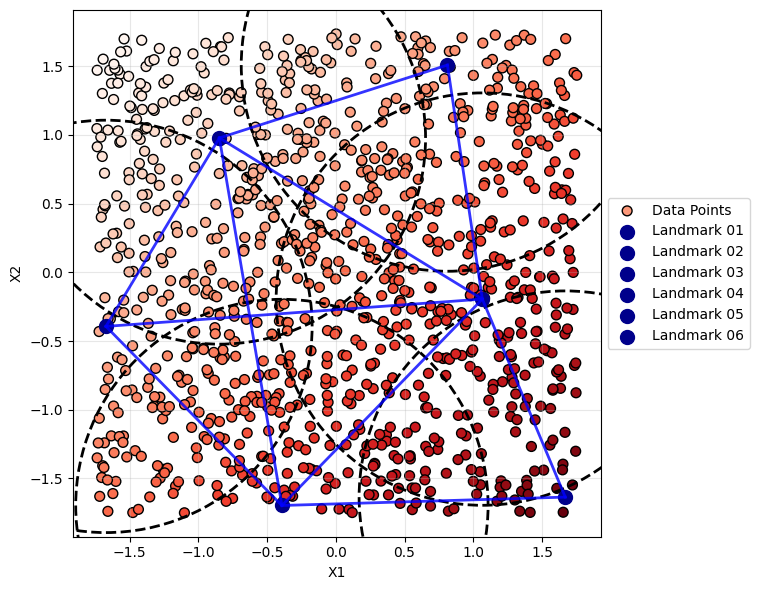

In [1581]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centers1 = {
    'circle01': (random_point101['X1'], random_point101['X2']),
    'circle02': (random_point102['X1'], random_point102['X2']),
    'circle03': (random_point103['X1'], random_point103['X2']),
    'circle04': (random_point104['X1'], random_point104['X2']),
    'circle05': (random_point105['X1'], random_point105['X2']),
    'circle06': (random_point106['X1'], random_point106['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centers1.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs1 = list(combinations(circle_centers1.keys(), 2))
for circle1, circle2 in circle_pairs1:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centers1[circle1]
        x2, y2 = circle_centers1[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd1p08.png', dpi=300)

And repeat for dataset 2

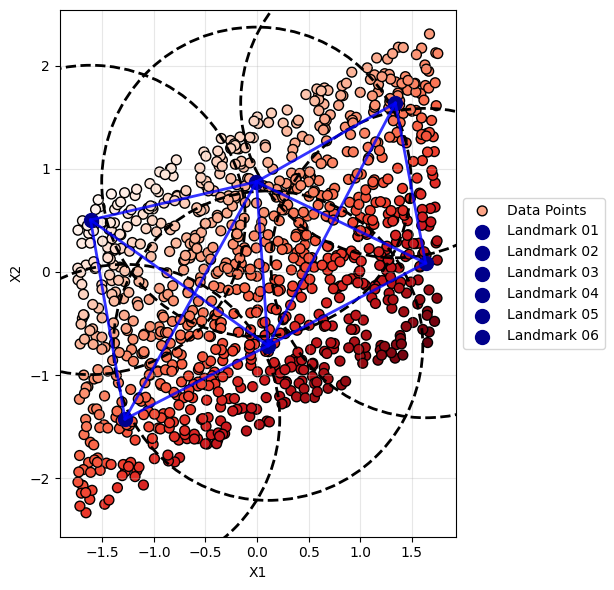

In [1582]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centers2 = {
    'circle01': (random_point201['X1'], random_point201['X2']),
    'circle02': (random_point202['X1'], random_point202['X2']),
    'circle03': (random_point203['X1'], random_point203['X2']),
    'circle04': (random_point204['X1'], random_point204['X2']),
    'circle05': (random_point205['X1'], random_point205['X2']),
    'circle06': (random_point206['X1'], random_point206['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centers2.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs2 = list(combinations(circle_centers2.keys(), 2))
for circle1, circle2 in circle_pairs2:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centers2[circle1]
        x2, y2 = circle_centers2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd2p08.png', dpi=300)

The aim is to produce a TDABM equivalent plot. Therefore, the next step is to resize the landmark points according to the number of points in the ball. Also, it is an opportunity to recolor the landmark points according to the average value of Y within each ball. The code will now compute these average values and the necessary sizes

In [1583]:
circle_cols = [col for col in df1.columns if col.startswith('inside_circle')]

In [1584]:
circle_stats1 = pd.DataFrame([
    {
        'Circle': col.split('_')[-1],  # Extracts number from column name (e.g., '01')
        'Y_Mean': df1.loc[df1[col] == 1, 'Y'].mean(),
        'Count': df1[col].sum()
    }
    for col in circle_cols
])


In [1585]:
cc1 = pd.DataFrame.from_dict(circle_centers1, orient='index', columns=['X1', 'X2'])
cc1.reset_index(inplace=True)
cc1.rename(columns={'index': 'Circle'}, inplace=True)

cs1 = pd.DataFrame(circle_stats1)

cs1 = pd.merge(cc1,cs1,on="Circle")

cs1['Count2'] = 3*cs1['Count']
cs1.head()

,Circle,X1,X2,Y_Mean,Count,Count2
0,circle01,1.066148,-0.194925,0.933616,461,1383
1,circle02,-0.392186,-1.696335,0.705165,295,885
2,circle03,-0.847053,0.977508,-1.315963,394,1182
3,circle04,0.812119,1.507765,-0.369273,294,882
4,circle05,1.669544,-1.635398,2.094422,166,498


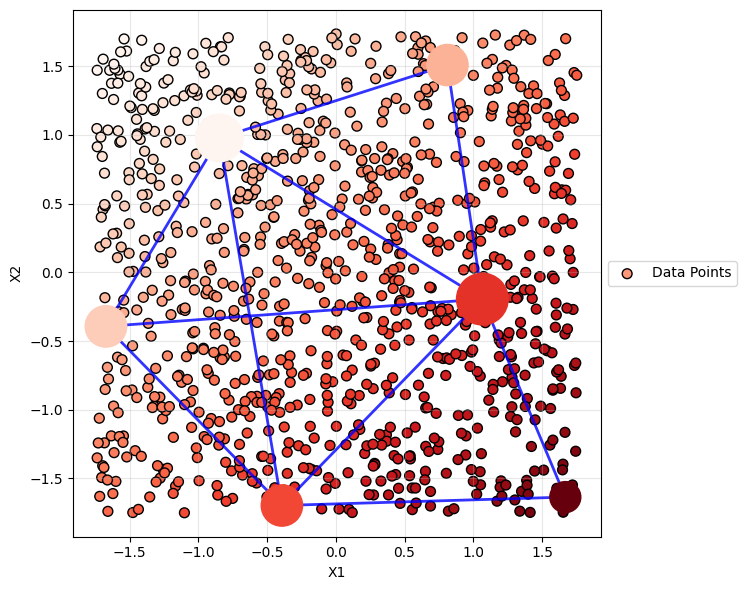

In [1586]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs1 = list(combinations(circle_centers1.keys(), 2))
for circle1, circle2 in circle_pairs1:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centers1[circle1]
        x2, y2 = circle_centers1[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs1['X1'], cs1['X2'], c=cs1['Y_Mean'], cmap='Reds',s=cs1['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd1m01.png', dpi=300)

With the data from the individual data points incorporated into the discs that represent each ball, the remaining datapoints can be turned off

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


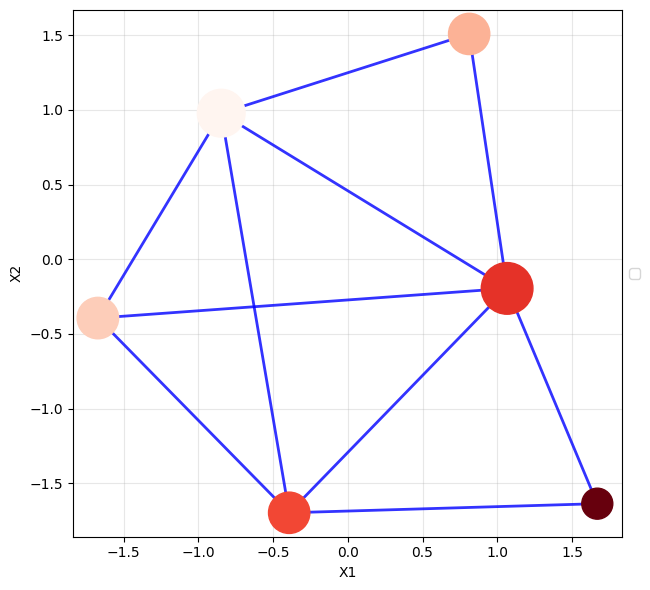

In [1587]:
plt.figure(figsize=(8, 6))

# Draw circles first (zorder=2)
plt.scatter(cs1['X1'], cs1['X2'], c=cs1['Y_Mean'], cmap='Reds',s=cs1['Count2'], zorder=5)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs1 = list(combinations(circle_centers1.keys(), 2))
for circle1, circle2 in circle_pairs1:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centers1[circle1]
        x2, y2 = circle_centers1[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd1m02.png', dpi=300)

Finally, the axes can be turned off to emphasize the abstract nature of the TDABM plot. Note that the balls remain in their correct locations on the X1,X2 space

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


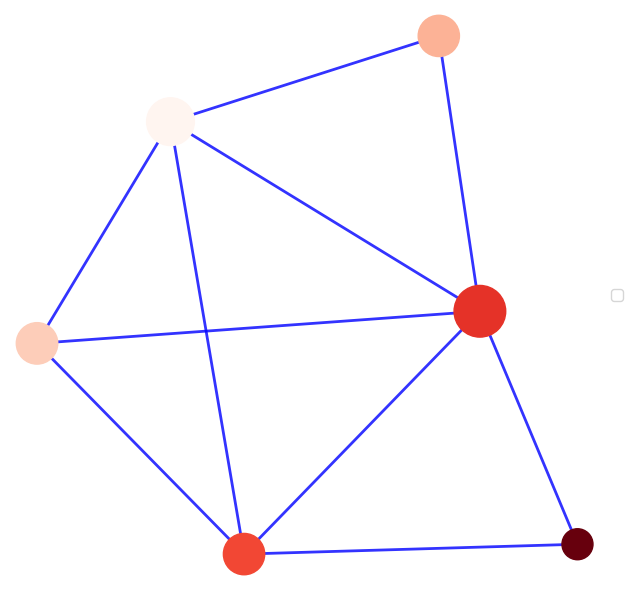

In [1588]:
plt.figure(figsize=(8, 6))

# Draw circles first (zorder=2)
plt.scatter(cs1['X1'], cs1['X2'], c=cs1['Y_Mean'], cmap='Reds',s=cs1['Count2'], zorder=5)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs1 = list(combinations(circle_centers1.keys(), 2))
for circle1, circle2 in circle_pairs1:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centers1[circle1]
        x2, y2 = circle_centers1[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(False)
plt.axis('off')
plt.tight_layout()

plt.savefig('rawd1m03.png', dpi=300)

The result is a highly connected graph in which most of the balls are simiarly sized. 

The process of constructing an equivalent TDABM graph for the second dataset requires some small ammendments to the code

In [1589]:
circle_cols2 = [col for col in df2.columns if col.startswith('inside_circle')]

circle_stats2 = pd.DataFrame([
    {
        'Circle': col.split('_')[-1],  # Extracts number from column name (e.g., '01')
        'Y_Mean': df2.loc[df1[col] == 1, 'Y'].mean(),
        'Count': df2[col].sum()
    }
    for col in circle_cols2
])

cc2 = pd.DataFrame.from_dict(circle_centers2, orient='index', columns=['X1', 'X2'])
cc2.reset_index(inplace=True)
cc2.rename(columns={'index': 'Circle'}, inplace=True)

cs2 = pd.DataFrame(circle_stats2)

cs2 = pd.merge(cc2,cs2,on="Circle")

cs2['Count2'] = 3*cs2['Count']
cs2.head()

,Circle,X1,X2,Y_Mean,Count,Count2
0,circle01,1.634686,0.086368,0.530048,320,960
1,circle02,-1.279699,-1.426267,0.751022,309,927
2,circle03,-0.006047,0.874305,-0.911305,486,1458
3,circle04,1.341740,1.637543,-0.537038,266,798
4,circle05,0.107287,-0.714710,1.429867,529,1587


Now follow the previous plotting codes to progress the the TDABM equivalent. First generate a plot of the data with the balls resized on top

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


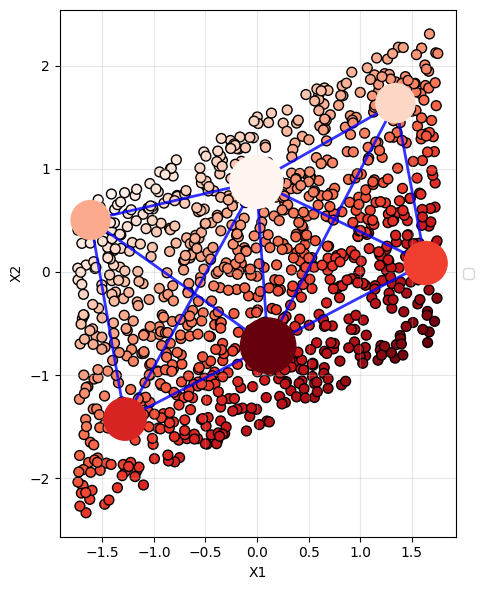

In [1590]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['Y'], cmap='Reds', 
                     label="", edgecolors='k', s=50, zorder=1)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs2 = list(combinations(circle_centers2.keys(), 2))
for circle1, circle2 in circle_pairs2:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centers2[circle1]
        x2, y2 = circle_centers2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs2['X1'], cs2['X2'], c=cs2['Y_Mean'], cmap='Reds',s=cs2['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd2m01.png', dpi=300)

Now remove the data points to leave only the discs

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


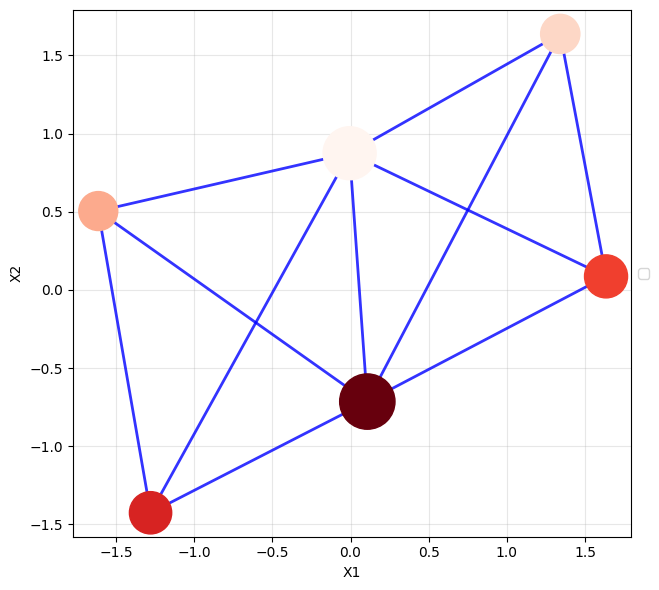

In [1591]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---

plt.scatter(cs2['X1'], cs2['X2'], c=cs2['Y_Mean'], cmap='Reds',s=cs2['Count2'], zorder=5)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs2 = list(combinations(circle_centers2.keys(), 2))
for circle1, circle2 in circle_pairs2:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centers2[circle1]
        x2, y2 = circle_centers2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)


# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('rawd2m02.png', dpi=300)

Finally turn off the grid to leave only the TDABM equivalent graph

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


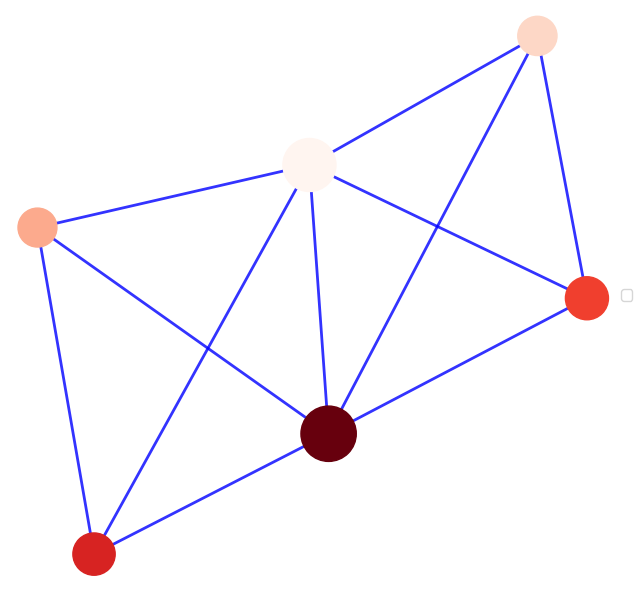

In [1592]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---

plt.scatter(cs2['X1'], cs2['X2'], c=cs2['Y_Mean'], cmap='Reds',s=cs2['Count2'], zorder=5)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairs2 = list(combinations(circle_centers2.keys(), 2))
for circle1, circle2 in circle_pairs2:
    col1 = f"inside_{circle1}"
    col2 = f"inside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centers2[circle1]
        x2, y2 = circle_centers2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)


# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(False)
plt.axis('off')
plt.tight_layout()

plt.savefig('rawd2m03.png', dpi=300)

# Following the TDABM Algorithm

The TDABM algorithm as implemented in Python uses the first uncovered point as the next landmark. This has the advantage of allowing the user to shuffle the dataset to obtain alternative representations. In this part of the notebook, I repeat the analysis above with the first uncovered point being the landmark.

Because of the addition of columns to the df1 and df2 dataframes in the theoretical example, the df1 and df2 dataframes are regenerated here.

In [1593]:
# Set seed for reproducibility
np.random.seed(101)

# Generate two independent uniform random variables
n = 1000
X1 = np.random.uniform(size=n)
X2 = np.random.uniform(size=n)

# Step 3: Create a correlated variable
# Standardize X1 and X2
X1_scaled = (X1 - np.mean(X1)) / np.std(X1)
X2_scaled = (X2 - np.mean(X2)) / np.std(X2)

# Dataset with 0 correlation by just using the two variables
df1=pd.DataFrame({
    'X1': X1_scaled,
    'X2': X2_scaled
})

# Create X2_adjusted to have a correlation of about 0.5 with X1
X2_adjusted = 0.5 * X1_scaled + np.sqrt(1 - 0.5**2) * X2_scaled

# Put into a DataFrame
df2 = pd.DataFrame({
    'X1': X1_scaled,
    'X2': X2_adjusted
})

df1['Y'] = df1['X1'] - df1['X2']
df2['Y'] = df2['X1'] - df2['X2']

# Create an index for the dataframes. This will be needed later for merging
df1['point'] = df1.index
df2['point'] = df2.index


Begin by identifying the first point as the first landmark

In [1594]:
first_point_index = 0
first_point1 = df1.loc[first_point_index]
first_point2 = df2.loc[first_point_index]

Now generate the distances from all points to the first point

In [1595]:
df1['distance01'] = np.sqrt((df1['X1'] - first_point1['X1'])**2 + (df1['X2'] - first_point1['X2'])**2)
df2['distance01'] = np.sqrt((df2['X1'] - first_point2['X1'])**2 + (df2['X2'] - first_point2['X2'])**2)

Check for inclusion in ball 1

In [1596]:
df1['ainside_circle01'] = (df1['distance01'] <= radius).astype(int)
df2['ainside_circle01'] = (df2['distance01'] <= radius).astype(int)

Generate a circle_membership variable. Here an a is added to distinguish the variable from the previous section

In [1597]:
df1['circle_membershipa'] = np.where(df1['ainside_circle01'] == 1, 1, 9)
df2['circle_membershipa'] = np.where(df2['ainside_circle01'] == 1, 1, 9)

Create the plot using similar code to previously

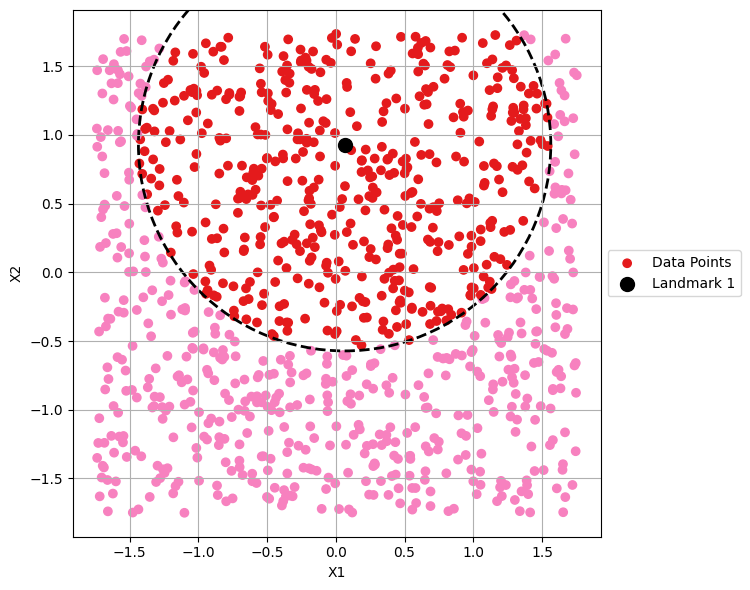

In [1598]:
plt.figure(figsize=(8, 6))
plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points")
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)
circle = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle)
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.tight_layout()
plt.savefig('bmsd1p01.png', dpi=300)

Now create the plot for the second dataset

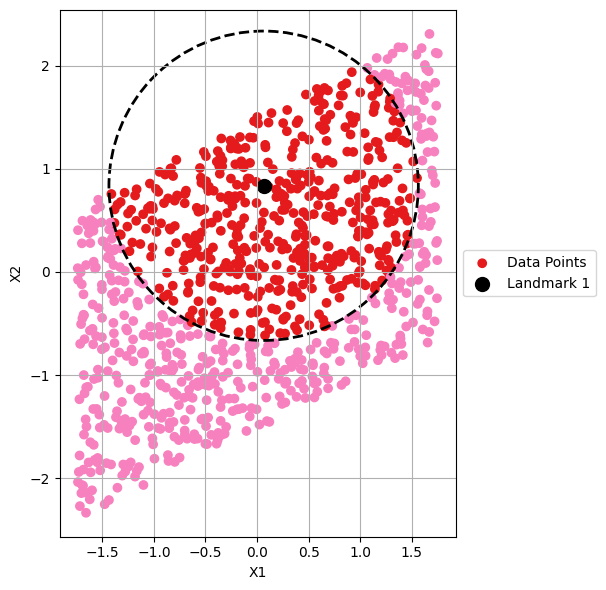

In [1599]:
plt.figure(figsize=(8, 6))
plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membershipa'], cmap=cmap2,norm=norm2, label="Data Points")
plt.scatter(first_point2['X1'], first_point2['X2'], color='black', label="Landmark 1", s=100)
circle = plt.Circle((first_point2['X1'], first_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle)
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal', adjustable='box')
plt.grid(True)
plt.tight_layout()
plt.savefig('bmsd2p01.png', dpi=300)

Next identify the lowest index in the dataframe that is still uncovered

In [1600]:
second_point_index1 = df1[(df1['ainside_circle01'] == 0)].index[0]  # Select the first point not inside circle 1
second_point_index2 = df2[(df2['ainside_circle01'] == 0)].index[0]  # Select the first point not inside circle 1
second_point1 = df1.loc[second_point_index1]
second_point2 = df2.loc[second_point_index2]

Compute the distances to the second landmark

In [1601]:
df1['distance02'] = np.sqrt((df1['X1'] - second_point1['X1'])**2 + (df1['X2'] - second_point1['X2'])**2)
df2['distance02'] = np.sqrt((df2['X1'] - second_point2['X1'])**2 + (df2['X2'] - second_point2['X2'])**2)

Now identify the points within the circles surrounding the second landmark

In [1602]:
df1['ainside_circle02'] = (df1['distance02'] <= radius).astype(int)
df2['ainside_circle02'] = (df2['distance02'] <= radius).astype(int)

Now construct the circle_membership variable which builds as the balls are added

In [1603]:
df1['circle_membershipa'] = 0  # Default is 0, meaning not inside any circle

df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 0), 'circle_membershipa'] = 1
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle01'] == 0), 'circle_membershipa'] = 2
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0), 'circle_membershipa'] = 9

df2['circle_membershipa'] = 0  # Default is 0, meaning not inside any circle

df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 0), 'circle_membershipa'] = 1
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle01'] == 0), 'circle_membershipa'] = 2
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0), 'circle_membershipa'] = 9

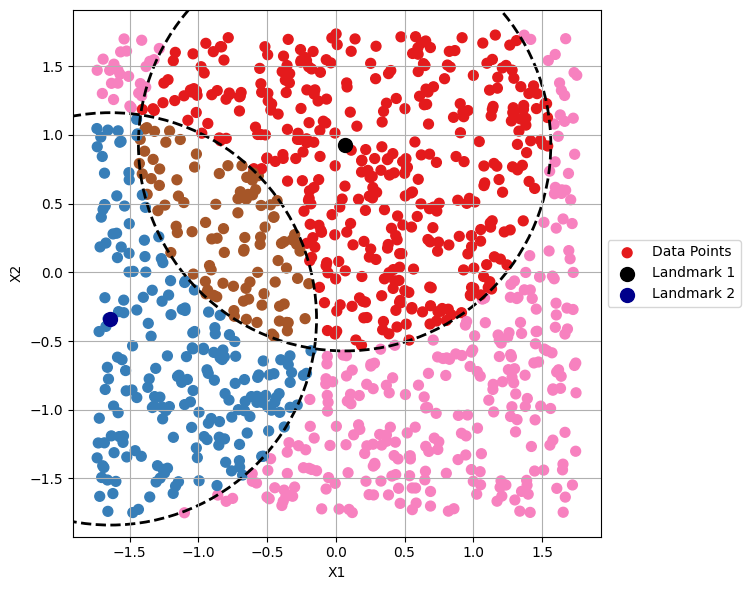

In [1604]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point1['X1'], second_point1['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point1['X1'], second_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd1p02.png', dpi=300)

Repeat for the second dataset

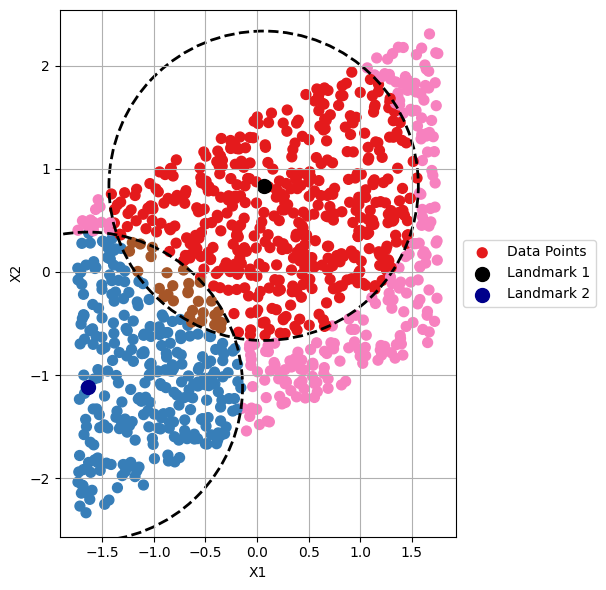

In [1605]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point2['X1'], first_point2['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point2['X1'], first_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point2['X1'], second_point2['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point2['X1'], second_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd2p02.png', dpi=300)

In this case the two balls do not have any intersection. The process continues by identifying the lowest index in the dataframe that has not yet been included in a ball. Now inclusion is tested using the circle_membershipa variable

In [1606]:
third_point_index1 = df1[(df1['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
third_point_index2 = df2[(df2['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
third_point1 = df1.loc[third_point_index1]
third_point2 = df2.loc[third_point_index2]

Compute the distances from the third_point

In [1607]:
df1['distance03'] = np.sqrt((df1['X1'] - third_point1['X1'])**2 + (df1['X2'] - third_point1['X2'])**2)
df2['distance03'] = np.sqrt((df2['X1'] - third_point2['X1'])**2 + (df2['X2'] - third_point2['X2'])**2)

Identify the points in ball 3

In [1608]:
df1['ainside_circle03'] = (df1['distance03'] <= radius).astype(int)
df2['ainside_circle03'] = (df2['distance03'] <= radius).astype(int)

Now create the circle membership variable for the three ball case

In [1609]:
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0), 'circle_membershipa'] = 1
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle01'] == 0) & (df1['ainside_circle03'] == 0), 'circle_membershipa'] = 2
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0), 'circle_membershipa'] = 3

# Points inside two or more circles
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 1), 'circle_membershipa'] = 8

# Points inside none of the circles
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0), 'circle_membershipa'] = 9

# Repeat for Dataset 2

df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0), 'circle_membershipa'] = 1
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle01'] == 0) & (df2['ainside_circle03'] == 0), 'circle_membershipa'] = 2
df2.loc[(df2['ainside_circle03'] == 1) & (df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0), 'circle_membershipa'] = 3

# Points inside two or more circles
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle03'] == 1), 'circle_membershipa'] = 8

# Points inside none of the circles
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0), 'circle_membershipa'] = 9

It is now possible to plot the three circles

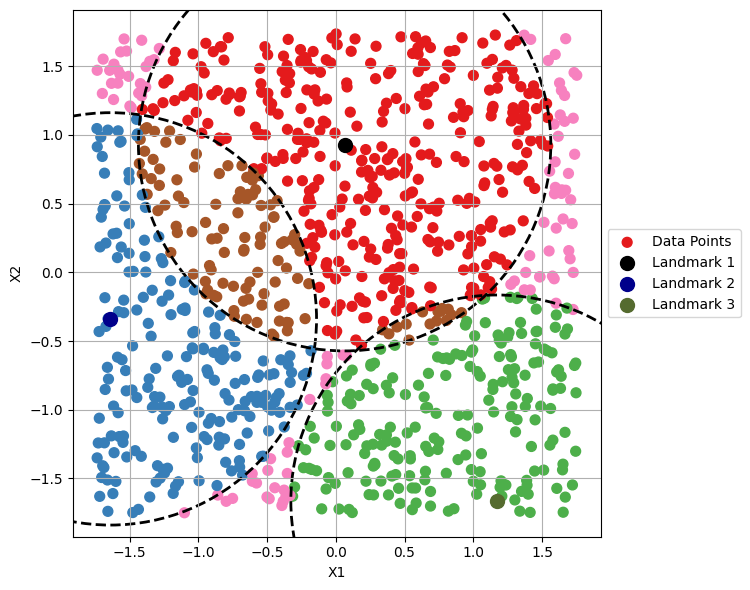

In [1610]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point1['X1'], second_point1['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point1['X1'], second_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point1['X1'], third_point1['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((third_point1['X1'], third_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd1p03.png', dpi=300)

In this instance, there is a narrow band of uncovered points to the centre left. There will need to be three more balls to generate the cover

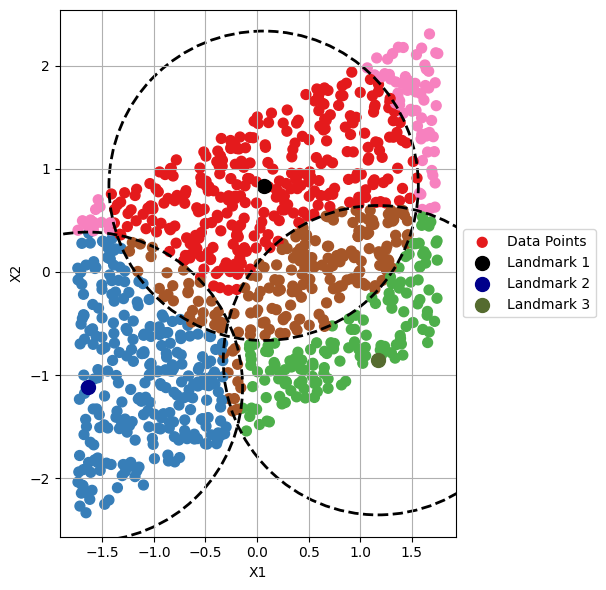

In [1611]:
plt.figure(figsize=(8, 6))  # Make the figure square

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point2['X1'], first_point2['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point2['X1'], first_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point2['X1'], second_point2['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point2['X1'], second_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point2['X1'], third_point2['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((third_point2['X1'], third_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd2p03.png', dpi=300)

The ball around landmark 3 is to the lower right and completes the coverage of all points with X2<0. The uncovered points are all at the higher values of X2 for each X1.

The fourth landmark is identified in the same way

In [1612]:
fourth_point_index1 = df1[(df1['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
fourth_point_index2 = df2[(df2['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
fourth_point1 = df1.loc[fourth_point_index1]
fourth_point2 = df2.loc[fourth_point_index2]

Generate the distances from the fourth landmark

In [1613]:
df1['distance04'] = np.sqrt((df1['X1'] - fourth_point1['X1'])**2 + (df1['X2'] - fourth_point1['X2'])**2)
df2['distance04'] = np.sqrt((df2['X1'] - fourth_point2['X1'])**2 + (df2['X2'] - fourth_point2['X2'])**2)

And identify the points within ball 4

In [1614]:
df1['ainside_circle04'] = (df1['distance04'] <= radius).astype(int)
df2['ainside_circle04'] = (df2['distance04'] <= radius).astype(int)

Construction of the circle_membership variable becomes progressively harder

In [1615]:
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0), 'circle_membershipa'] = 1
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0), 'circle_membershipa'] = 2
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 0), 'circle_membershipa'] = 3
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 4

# Points inside two circles
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 8

# Points inside none of the circles
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0), 'circle_membershipa'] = 9

# Repeat for Dataset 2

df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0), 'circle_membershipa'] = 1
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 1) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0), 'circle_membershipa'] = 2
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 1) & (df2['ainside_circle04'] == 0), 'circle_membershipa'] = 3
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 4

# Points inside two circles
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle03'] == 1) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 8

# Points inside none of the circles
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0), 'circle_membershipa'] = 9

Create the plots with 4 balls

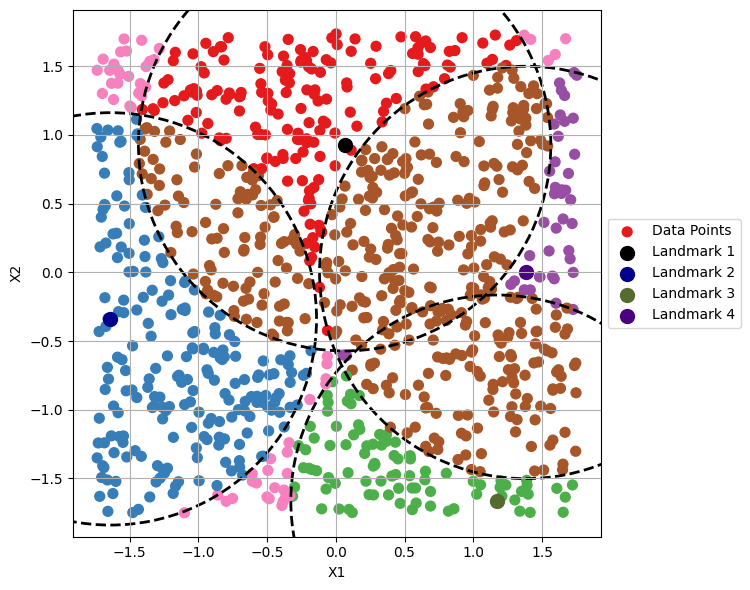

In [ ]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point1['X1'], second_point1['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point1['X1'], second_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point1['X1'], third_point1['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((third_point1['X1'], third_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(fourth_point1['X1'], fourth_point1['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((fourth_point1['X1'], fourth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd1p04.png', dpi=300)

There are still three areas with uncovered points left to cover with circles. Meanwhile for the second dataset

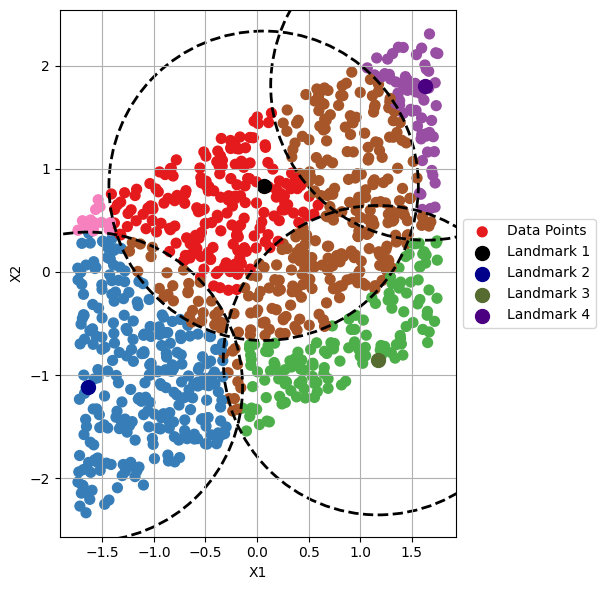

In [1617]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point2['X1'], first_point2['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point2['X1'], first_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point2['X1'], second_point2['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point2['X1'], second_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point2['X1'], third_point2['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((third_point2['X1'], third_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(fourth_point2['X1'], fourth_point2['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the second circle around the second random point
circle3 = plt.Circle((fourth_point2['X1'], fourth_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd2p04.png', dpi=300)

The second dataset will only require one more ball. In both cases it is necessary to proceed to ball 5

In [1618]:
fifth_point_index1 = df1[(df1['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
fifth_point_index2 = df2[(df2['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
fifth_point1 = df1.loc[fifth_point_index1]
fifth_point2 = df2.loc[fifth_point_index2]

Now generate the distances to the fifth landmark

In [1619]:
df1['distance05'] = np.sqrt((df1['X1'] - fifth_point1['X1'])**2 + (df1['X2'] - fifth_point1['X2'])**2)
df2['distance05'] = np.sqrt((df2['X1'] - fifth_point2['X1'])**2 + (df2['X2'] - fifth_point2['X2'])**2)

Identify the points within ball 5

In [1620]:
df1['ainside_circle05'] = (df1['distance05'] <= radius).astype(int)
df2['ainside_circle05'] = (df2['distance05'] <= radius).astype(int)

Now build the circle membership by adding the combinations involving a fifth circle

In [1621]:
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0), 'circle_membershipa'] = 1
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0), 'circle_membershipa'] = 2
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0), 'circle_membershipa'] = 3
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 1) & (df1['ainside_circle05'] == 0), 'circle_membershipa'] = 4
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 1), 'circle_membershipa'] = 5

# Points inside two circles
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle05'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle05'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle05'] == 1), 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle04'] == 1) & (df1['ainside_circle05'] == 1), 'circle_membershipa'] = 8

# Points in no circles

df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0), 'circle_membershipa'] = 9

# Repeat for Dataset 2

df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0) & (df2['ainside_circle05'] == 0), 'circle_membershipa'] = 1
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 1) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0) & (df2['ainside_circle05'] == 0), 'circle_membershipa'] = 2
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 1) & (df2['ainside_circle04'] == 0) & (df2['ainside_circle05'] == 0), 'circle_membershipa'] = 3
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 1) & (df2['ainside_circle05'] == 0), 'circle_membershipa'] = 4
df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0) & (df2['ainside_circle05'] == 1), 'circle_membershipa'] = 5

# Points inside two circles
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle02'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle01'] == 1) & (df2['ainside_circle05'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle03'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle02'] == 1) & (df2['ainside_circle05'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle03'] == 1) & (df2['ainside_circle04'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle03'] == 1) & (df2['ainside_circle05'] == 1), 'circle_membershipa'] = 8
df2.loc[(df2['ainside_circle04'] == 1) & (df2['ainside_circle05'] == 1), 'circle_membershipa'] = 8

# Points in no circles

df2.loc[(df2['ainside_circle01'] == 0) & (df2['ainside_circle02'] == 0) & (df2['ainside_circle03'] == 0) & (df2['ainside_circle04'] == 0) & (df2['ainside_circle05'] == 0), 'circle_membershipa'] = 9

Now the plots can be produced. The process for plotting remains the same as in previous numbers of balls

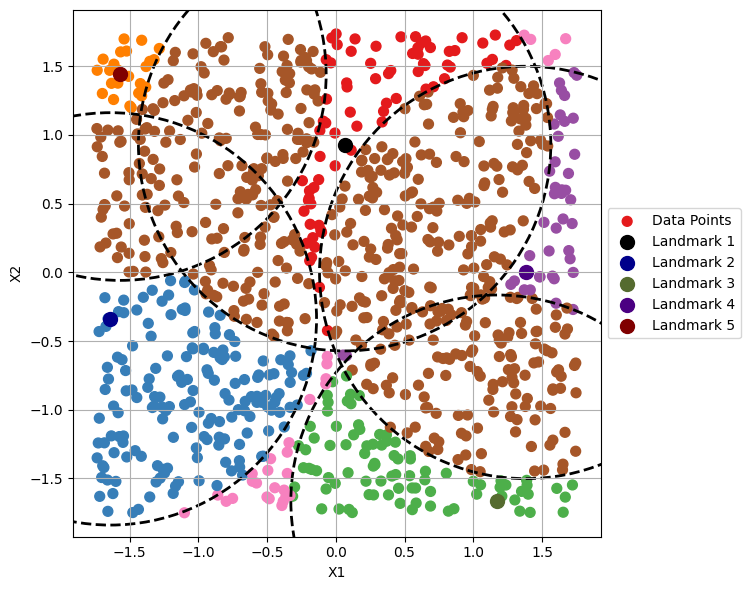

In [1622]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point1['X1'], second_point1['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point1['X1'], second_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point1['X1'], third_point1['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the second random point
circle3 = plt.Circle((third_point1['X1'], third_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(fourth_point1['X1'], fourth_point1['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the second random point
circle4 = plt.Circle((fourth_point1['X1'], fourth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(fifth_point1['X1'], fifth_point1['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the second random point
circle5 = plt.Circle((fifth_point1['X1'], fifth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd1p05.png', dpi=300)

The plot confirms that two more balls will be needed. Now do the second dataset

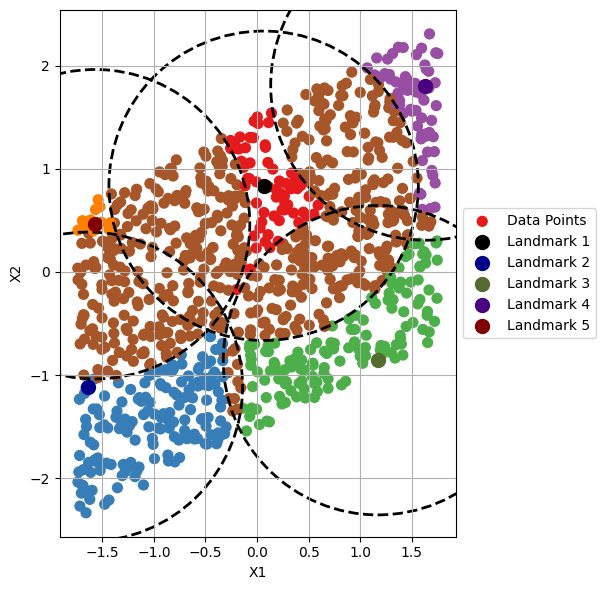

In [1623]:
plt.figure(figsize=(8, 6))  # Make the figure square

# Map the 'circle_membership' to colors
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point2['X1'], first_point2['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point2['X1'], first_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point2['X1'], second_point2['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point2['X1'], second_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point2['X1'], third_point2['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the second random point
circle3 = plt.Circle((third_point2['X1'], third_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(fourth_point2['X1'], fourth_point2['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the second random point
circle4 = plt.Circle((fourth_point2['X1'], fourth_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(fifth_point2['X1'], fifth_point2['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the second random point
circle5 = plt.Circle((fifth_point2['X1'], fifth_point2['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd2p05.png', dpi=300)

Full coverage for the correlated data set is confirmed. However, another two balls are needed for the uncorrelated data. 

The process continues with identifying the next landmark in data set 1

In [1624]:
sixth_point_index1 = df1[(df1['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
sixth_point1 = df1.loc[sixth_point_index1]

Compute the distances to the sixth point

In [1625]:
df1['distance06'] = np.sqrt((df1['X1'] - sixth_point1['X1'])**2 + (df1['X2'] - sixth_point1['X2'])**2)

Check which points are in ball 6

In [1626]:
df1['ainside_circle06'] = (df1['distance06'] <= radius).astype(int)

Update the circle membership variable

In [1627]:
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0), 'circle_membershipa'] = 1
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0), 'circle_membershipa'] = 2
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0), 'circle_membershipa'] = 3
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 1) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0), 'circle_membershipa'] = 4
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 1) & (df1['ainside_circle06'] == 0), 'circle_membershipa'] = 5
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 1), 'circle_membershipa'] = 6

# Points inside two circles
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle03'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle04'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle04'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle04'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle04'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle05'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8

# Finally the points in no circles

df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0), 'circle_membershipa'] = 9

Now the plot can be generated in the usual fashion

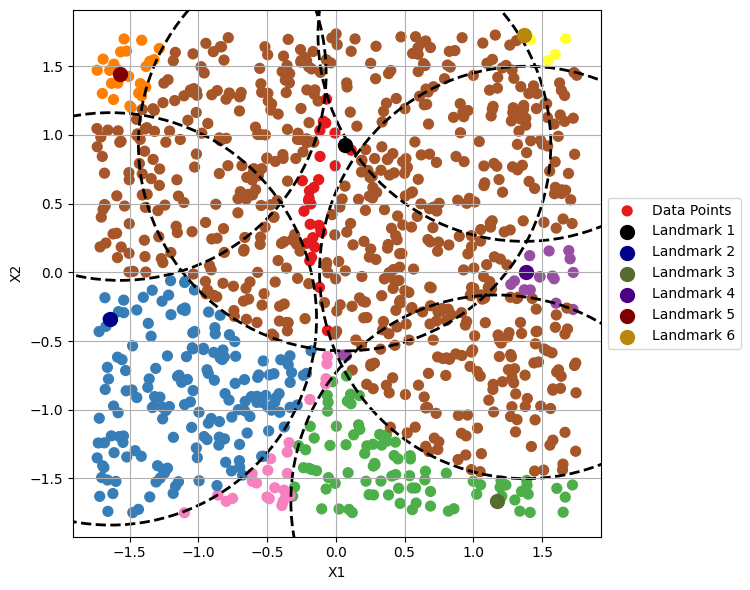

In [1628]:
plt.figure(figsize=(8, 6))  

# Map the 'circle_membership' to colors

scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point1['X1'], second_point1['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point1['X1'], second_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point1['X1'], third_point1['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the second random point
circle3 = plt.Circle((third_point1['X1'], third_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(fourth_point1['X1'], fourth_point1['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the second random point
circle4 = plt.Circle((fourth_point1['X1'], fourth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(fifth_point1['X1'], fifth_point1['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the fifth random point
circle5 = plt.Circle((fifth_point1['X1'], fifth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Highlight the fifth random point
plt.scatter(sixth_point1['X1'], sixth_point1['X2'], color='darkgoldenrod', label="Landmark 6", s=100)

# Draw the fifth circle around the fifth random point
circle6 = plt.Circle((sixth_point1['X1'], sixth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle6)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig('bmsd1p06.png', dpi=300)

In this case a 7th landmark is needed to handle the uncovered points to the lower left. The process continues in the usual fashion and is abridged here for brevity

In [1629]:
seventh_point_index1 = df1[(df1['circle_membershipa'] == 9)].index[0]  # Select the first point not inside circle 1
seventh_point1 = df1.loc[seventh_point_index1]

df1['distance07'] = np.sqrt((df1['X1'] - seventh_point1['X1'])**2 + (df1['X2'] - seventh_point1['X2'])**2)

df1['ainside_circle07'] = (df1['distance07'] <= radius).astype(int)

Now update the inclusion variables to allow for the seventh circle

In [1630]:
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 1
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 2
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 3
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 1) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 4
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 1) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 5
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 1) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 6
df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 1), 'circle_membershipa'] = 7

# Points inside two circles
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle02'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle03'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle04'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle01'] == 1) & (df1['ainside_circle07'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle03'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle04'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle02'] == 1) & (df1['ainside_circle07'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle04'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle03'] == 1) & (df1['ainside_circle07'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle04'] == 1) & (df1['ainside_circle05'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle04'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle04'] == 1) & (df1['ainside_circle07'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle05'] == 1) & (df1['ainside_circle06'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle05'] == 1) & (df1['ainside_circle07'] == 1) , 'circle_membershipa'] = 8
df1.loc[(df1['ainside_circle06'] == 1) & (df1['ainside_circle07'] == 1) , 'circle_membershipa'] = 8

# Finally the points that are in no balls

df1.loc[(df1['ainside_circle01'] == 0) & (df1['ainside_circle02'] == 0) & (df1['ainside_circle03'] == 0) & (df1['ainside_circle04'] == 0) & (df1['ainside_circle05'] == 0) & (df1['ainside_circle06'] == 0) & (df1['ainside_circle07'] == 0), 'circle_membershipa'] = 9

Now the plotting is completed in the normal manner

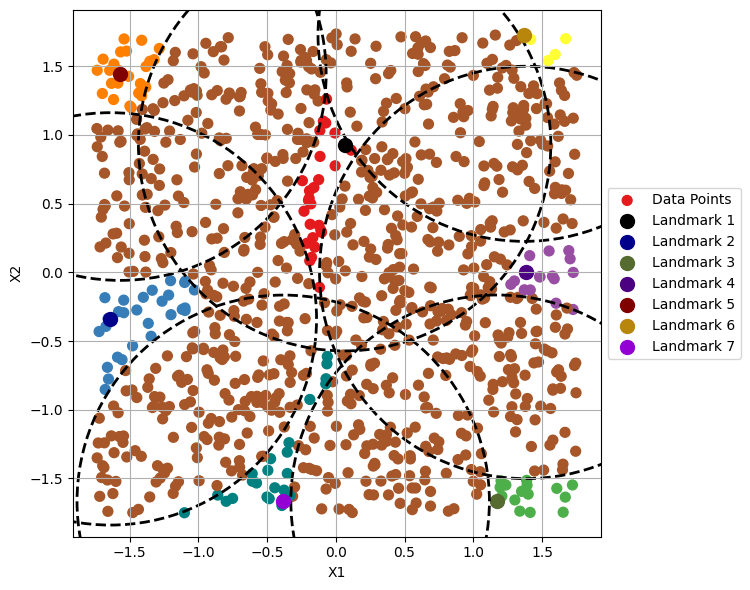

In [1631]:
plt.figure(figsize=(8, 6))  
# Map the 'circle_membership' to colors

scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, label="Data Points", edgecolors='face', s=50)

# Highlight the first random point
plt.scatter(first_point1['X1'], first_point1['X2'], color='black', label="Landmark 1", s=100)

# Draw the first circle around the first random point
circle1 = plt.Circle((first_point1['X1'], first_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle1)

# Highlight the second random point
plt.scatter(second_point1['X1'], second_point1['X2'], color='darkblue', label="Landmark 2", s=100)

# Draw the second circle around the second random point
circle2 = plt.Circle((second_point1['X1'], second_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle2)

# Highlight the third random point
plt.scatter(third_point1['X1'], third_point1['X2'], color='darkolivegreen', label="Landmark 3", s=100)

# Draw the third circle around the second random point
circle3 = plt.Circle((third_point1['X1'], third_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle3)

# Highlight the fourth random point
plt.scatter(fourth_point1['X1'], fourth_point1['X2'], color='indigo', label="Landmark 4", s=100)

# Draw the fourth circle around the second random point
circle4 = plt.Circle((fourth_point1['X1'], fourth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle4)

# Highlight the fifth random point
plt.scatter(fifth_point1['X1'], fifth_point1['X2'], color='maroon', label="Landmark 5", s=100)

# Draw the fifth circle around the fifth random point
circle5 = plt.Circle((fifth_point1['X1'], fifth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle5)

# Highlight the sixth random point
plt.scatter(sixth_point1['X1'], sixth_point1['X2'], color='darkgoldenrod', label="Landmark 6", s=100)

# Draw the sixth circle around the sixth random point
circle6 = plt.Circle((sixth_point1['X1'], sixth_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle6)

# Highlight the seventh random point
plt.scatter(seventh_point1['X1'], seventh_point1['X2'], color='darkviolet', label="Landmark 7", s=100)

# Draw the seventh circle around the seventh random point
circle7 = plt.Circle((seventh_point1['X1'], seventh_point1['X2']), radius, color='black', fill=False, linestyle='--', linewidth=2)
plt.gca().add_artist(circle7)

# Add labels and title
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')

# Place legend on the right of the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Set aspect ratio to be equal, making the plot square
plt.gca().set_aspect('equal', adjustable='box')

# Display grid and tighten layout
plt.grid(True)
plt.tight_layout()


# Save the plot
plt.savefig('bmsd1p07.png', dpi=300)

Now that the full cover is complete, the large extent of overlap is clear. 

In TDABM, the overlap is used to construct the edges that form between the nodes of the graph. The first stage is creation of a dataframe of point centres.

In [1632]:
point_names = [
    first_point1, second_point1, third_point1, fourth_point1, fifth_point1, sixth_point1, seventh_point1
]

data = []
for i, point in enumerate(point_names, start=1):
    # Extract X1 and X2 from the point's dictionary
    x1 = point['X1']
    x2 = point['X2']
    # Append to the DataFrame data
    data.append({
        'circle_number': i,  
        'X1': x1,
        'X2': x2
    })

centers_dfb1 = pd.DataFrame(data)


There are also elements of the code which benefit from the centers being in a list style. This list is readily created

In [1633]:
centers_dfb1["circle_id"] = centers_dfb1["circle_number"].apply(lambda x: f"circle{x:02d}")
circle_centersb1 = centers_dfb1.set_index("circle_id")[["X1", "X2"]].to_dict(orient="index")

This block of code will identify the existence of points in the intersection of circles. Here the code uses the inside_circleXX form to identify non-empty intersections

In [1634]:
circle_idsb1 = [f"circle{i:02d}" for i in centers_dfb1["circle_number"]]
circle_pairsb1 = list(combinations(circle_idsb1, 2))

# Find intersecting pairs
intersecting_pairs1 = []
for circle1, circle2 in circle_pairsb1:
    col1 = f"ainside_{circle1}"  # e.g., "inside_circle01"
    col2 = f"ainside_{circle2}"  # e.g., "inside_circle02"
    
    if (df1[col1] & df1[col2]).any():
        intersecting_pairs1.append((circle1, circle2))


The graph is generated using similar code to the theoretical Ball Mapper implementation

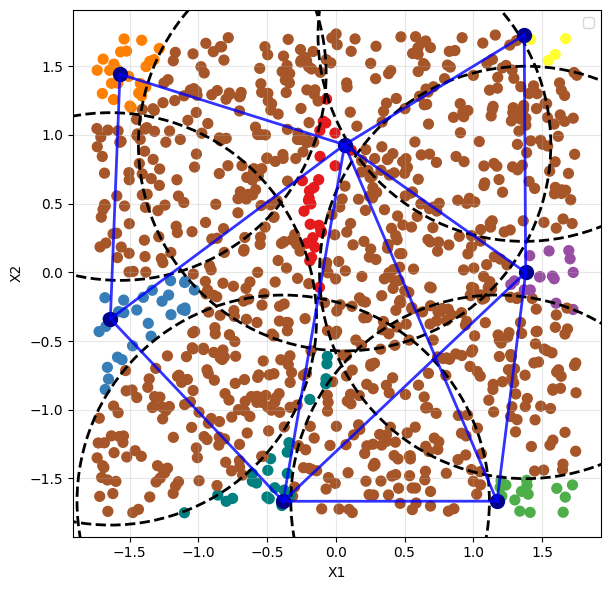

In [1635]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['circle_membershipa'], cmap=cmap2, norm=norm2, 
                     label="Data Points", edgecolors='face', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centersb = {
    'circle01': (first_point1['X1'], first_point1['X2']),
    'circle02': (second_point1['X1'], second_point1['X2']),
    'circle03': (third_point1['X1'], third_point1['X2']),
    'circle04': (fourth_point1['X1'], fourth_point1['X2']),
    'circle05': (fifth_point1['X1'], fifth_point1['X2']),
    'circle06': (sixth_point1['X1'], sixth_point1['X2']),
    'circle07': (seventh_point1['X1'], seventh_point1['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centersb.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb = list(combinations(circle_centersb.keys(), 2))
for circle1, circle2 in circle_pairsb:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centersb[circle1]
        x2, y2 = circle_centersb[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd1p08.png', dpi=300)



The plotting can be repeated with Y values used for coloration

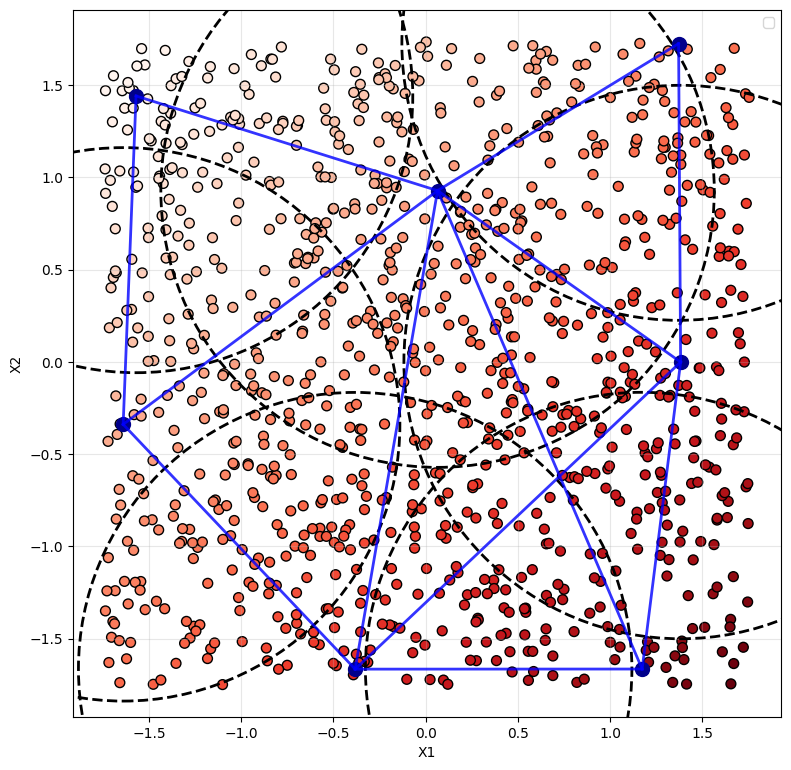

In [1636]:
plt.figure(figsize=(8, 8))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centersb = {
    'circle01': (first_point1['X1'], first_point1['X2']),
    'circle02': (second_point1['X1'], second_point1['X2']),
    'circle03': (third_point1['X1'], third_point1['X2']),
    'circle04': (fourth_point1['X1'], fourth_point1['X2']),
    'circle05': (fifth_point1['X1'], fifth_point1['X2']),
    'circle06': (sixth_point1['X1'], sixth_point1['X2']),
    'circle07': (seventh_point1['X1'], seventh_point1['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centersb.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb = list(combinations(circle_centersb.keys(), 2))
for circle1, circle2 in circle_pairsb:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centersb[circle1]
        x2, y2 = circle_centersb[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd1p09.png', dpi=300)

The process is repeated for the correlated dataset. However, here there are only 5 landmarks

In [1637]:
point_names = [
    first_point2, second_point2, third_point2, fourth_point2, fifth_point2
]

data = []
for i, point in enumerate(point_names, start=1):
    # Extract X1 and X2 from the point's dictionary
    x1 = point['X1']
    x2 = point['X2']
    # Append to the DataFrame data
    data.append({
        'circle_number': i,  
        'X1': x1,
        'X2': x2
    })

centers_dfb2 = pd.DataFrame(data)

The centers database should also be maintained as a list

In [1638]:
centers_dfb2["circle_id"] = centers_dfb2["circle_number"].apply(lambda x: f"circle{x:02d}")
circle_centersb2 = centers_dfb2.set_index("circle_id")[["X1", "X2"]].to_dict(orient="index")

Next construct the edges for the non-empty intersections

In [1639]:
circle_idsb2 = [f"circle{i:02d}" for i in centers_dfb2["circle_number"]]
circle_pairsb2 = list(combinations(circle_idsb2, 2))

# Find intersecting pairs
intersecting_pairs2 = []
for circle1, circle2 in circle_pairsb2:
    col1 = f"ainside_{circle1}"  # e.g., "inside_circle01"
    col2 = f"ainside_{circle2}"  # e.g., "inside_circle02"
    
    if (df2[col1] & df2[col2]).any():
        intersecting_pairs2.append((circle1, circle2))

The data may now be plotted with the edges added

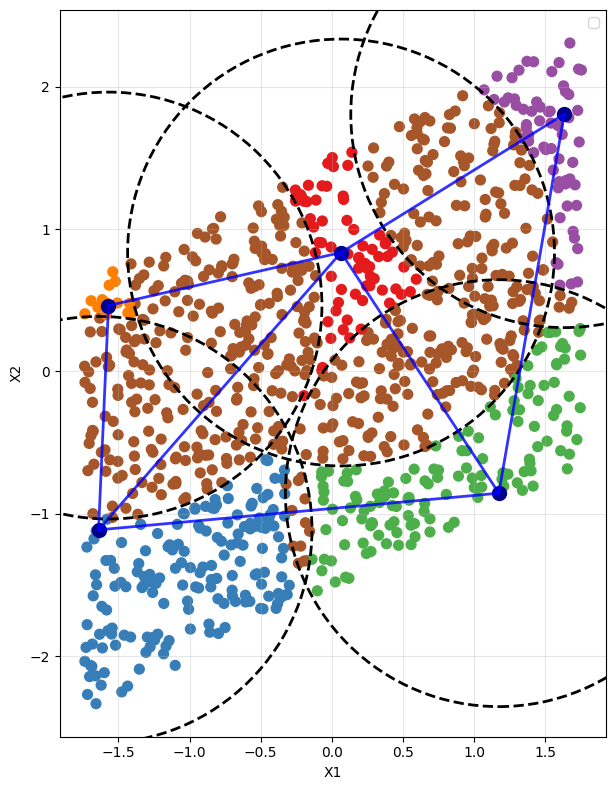

In [1640]:
plt.figure(figsize=(8, 8))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['circle_membershipa'], cmap=cmap2, norm=norm2, 
                     label="Data Points", edgecolors='face', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centersb2 = {
    'circle01': (first_point2['X1'], first_point2['X2']),
    'circle02': (second_point2['X1'], second_point2['X2']),
    'circle03': (third_point2['X1'], third_point2['X2']),
    'circle04': (fourth_point2['X1'], fourth_point2['X2']),
    'circle05': (fifth_point2['X1'], fifth_point2['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centersb2.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb2 = list(combinations(circle_centersb2.keys(), 2))
for circle1, circle2 in circle_pairsb2:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centersb2[circle1]
        x2, y2 = circle_centersb2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd2p08.png', dpi=300)

Now colored by the Y variable instead of the X variable

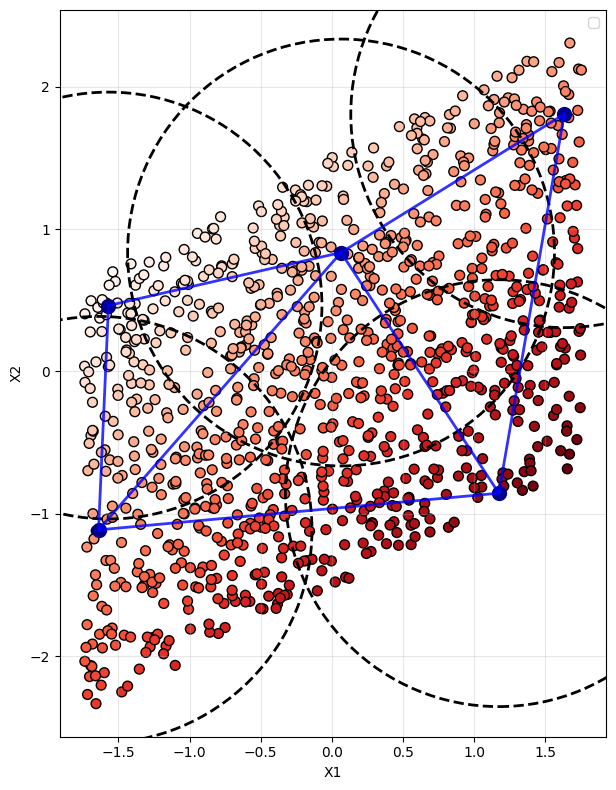

In [1641]:
plt.figure(figsize=(8, 8))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Define circle centers and draw circles ---
circle_centersb2 = {
    'circle01': (first_point2['X1'], first_point2['X2']),
    'circle02': (second_point2['X1'], second_point2['X2']),
    'circle03': (third_point2['X1'], third_point2['X2']),
    'circle04': (fourth_point2['X1'], fourth_point2['X2']),
    'circle05': (fifth_point2['X1'], fifth_point2['X2'])
}

# Draw circles first (zorder=2)
for circle_id, (x, y) in circle_centersb2.items():
    plt.scatter(x, y, color='darkblue', 
                s=100, label=f"Landmark {circle_id[-2:]}", zorder=3)
    circle = plt.Circle((x, y), radius, color='black', fill=False, 
                        linestyle='--', linewidth=2, zorder=2)
    plt.gca().add_artist(circle)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb2 = list(combinations(circle_centersb2.keys(), 2))
for circle1, circle2 in circle_pairsb2:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centersb2[circle1]
        x2, y2 = circle_centersb2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd2p09.png', dpi=300)

Now the TDABM equivalent plot can be generated as was done for the random landmark case.

In [1642]:
circle_cols1a = [
    "ainside_circle01","ainside_circle02","ainside_circle03","ainside_circle04","ainside_circle05","ainside_circle06","ainside_circle07"
]

circle_cols2a = [
    "ainside_circle01","ainside_circle02","ainside_circle03","ainside_circle04","ainside_circle05"
]

Generate the summary statistics for the ball memberships

In [1643]:
circle_stats1a = pd.DataFrame([
    {
        'Circle': col.split('_')[-1],  # Extracts number from column name (e.g., '01')
        'Y_Mean': df1.loc[df1[col] == 1, 'Y'].mean(),
        'Count': df1[col].sum()
    }
    for col in circle_cols1a
])

circle_stats2a = pd.DataFrame([
    {
        'Circle': col.split('_')[-1],  # Extracts number from column name (e.g., '01')
        'Y_Mean': df1.loc[df1[col] == 1, 'Y'].mean(),
        'Count': df1[col].sum()
    }
    for col in circle_cols2a
])

Now the summary statistics are combined with the landmark coordinates

In [1644]:
cc1a = pd.DataFrame.from_dict(circle_centersb1, orient='index', columns=['X1', 'X2'])
cc1a.reset_index(inplace=True)
cc1a.rename(columns={'index': 'Circle'}, inplace=True)

cs1a = pd.DataFrame(circle_stats1a)

cs1a = pd.merge(cc1a,cs1a,on="Circle")

cs1a['Count2'] = 3*cs1a['Count']

# For Dataset 2

cc2a = pd.DataFrame.from_dict(circle_centersb2, orient='index', columns=['X1', 'X2'])
cc2a.reset_index(inplace=True)
cc2a.rename(columns={'index': 'Circle'}, inplace=True)

cs2a = pd.DataFrame(circle_stats2a)

cs2a = pd.merge(cc2a,cs2a,on="Circle")

cs2a['Count2'] = 3*cs2a['Count']

The plots with the landmarks resized and recolored can now be produced. As in the first example, the first plot maintains all of the data points

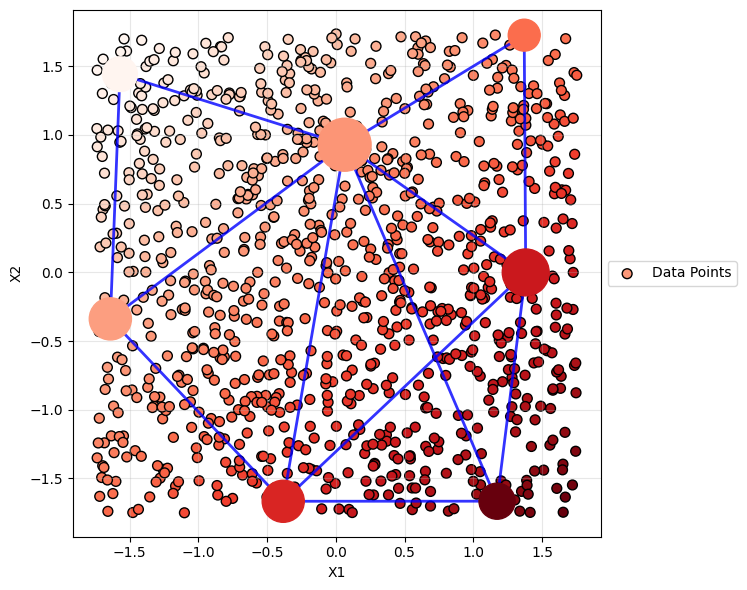

In [1645]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df1['X1'], df1['X2'], c=df1['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb = list(combinations(circle_centersb.keys(), 2))
for circle1, circle2 in circle_pairsb:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centersb[circle1]
        x2, y2 = circle_centersb[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs1a['X1'], cs1a['X2'], c=cs1a['Y_Mean'], cmap='Reds',s=cs1a['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd1m01.png', dpi=300)

Next drop the data points to leave only the indicative TDABM structure

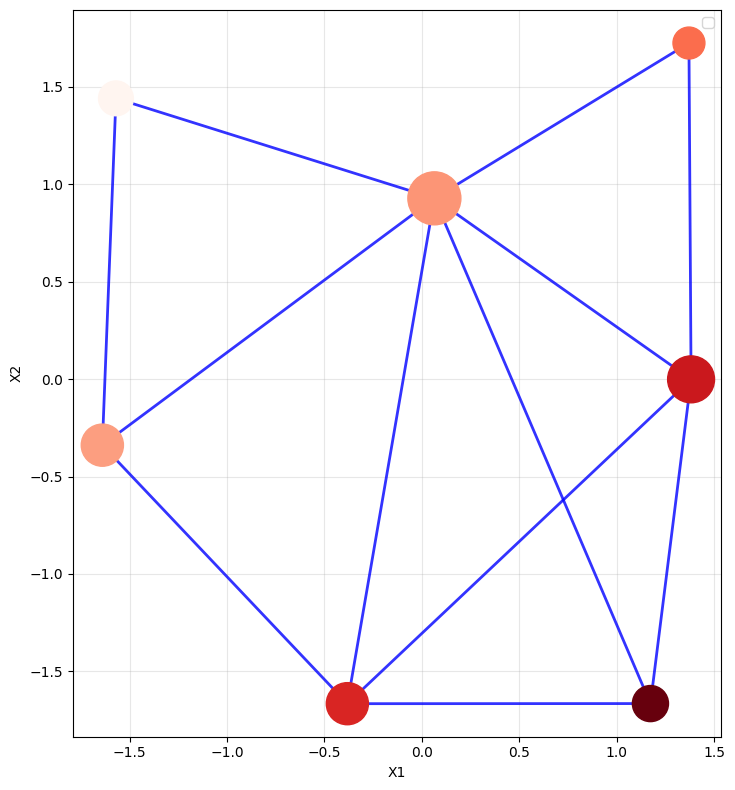

In [1650]:
plt.figure(figsize=(8, 8))

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb = list(combinations(circle_centersb.keys(), 2))
for circle1, circle2 in circle_pairsb:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centersb[circle1]
        x2, y2 = circle_centersb[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs1a['X1'], cs1a['X2'], c=cs1a['Y_Mean'], cmap='Reds',s=cs1a['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd1m02.png', dpi=300)

Finally for dataset 1 the axes can be removed to leave the TDABM structure

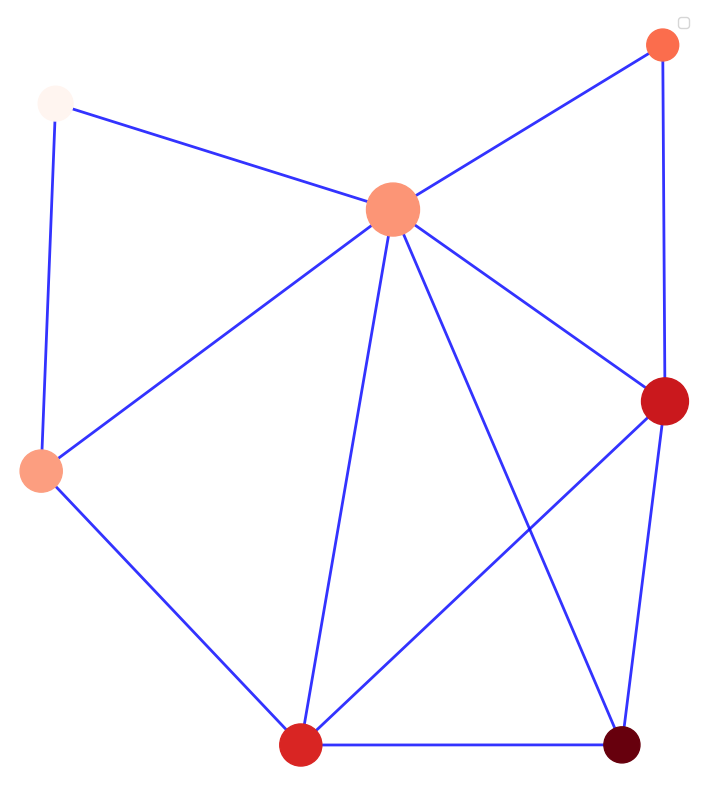

In [1651]:
plt.figure(figsize=(8, 8))

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb = list(combinations(circle_centersb.keys(), 2))
for circle1, circle2 in circle_pairsb:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df1[col1].astype(bool) & df1[col2].astype(bool)).any():
        x1, y1 = circle_centersb[circle1]
        x2, y2 = circle_centersb[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs1a['X1'], cs1a['X2'], c=cs1a['Y_Mean'], cmap='Reds',s=cs1a['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(False)
plt.axis('off')
plt.tight_layout()

plt.savefig('bmsd1m03.png', dpi=300)

Now the same steps are repeated for Dataset 2

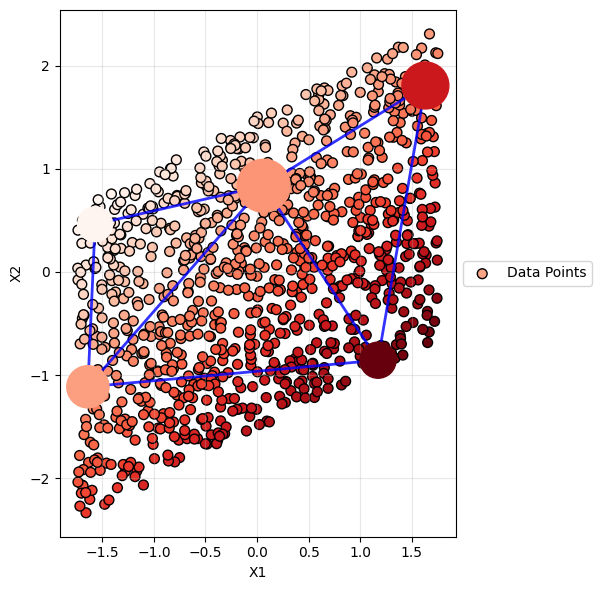

In [1652]:
plt.figure(figsize=(8, 6))

# --- Plot data points and landmarks ---
scatter = plt.scatter(df2['X1'], df2['X2'], c=df2['Y'], cmap='Reds', 
                     label="Data Points", edgecolors='k', s=50, zorder=1)

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb2 = list(combinations(circle_centersb2.keys(), 2))
for circle1, circle2 in circle_pairsb2:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centersb2[circle1]
        x2, y2 = circle_centersb2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs2a['X1'], cs2a['X2'], c=cs2a['Y_Mean'], cmap='Reds',s=cs2a['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd2m01.png', dpi=300)

Remvoing the non-landmark data points/

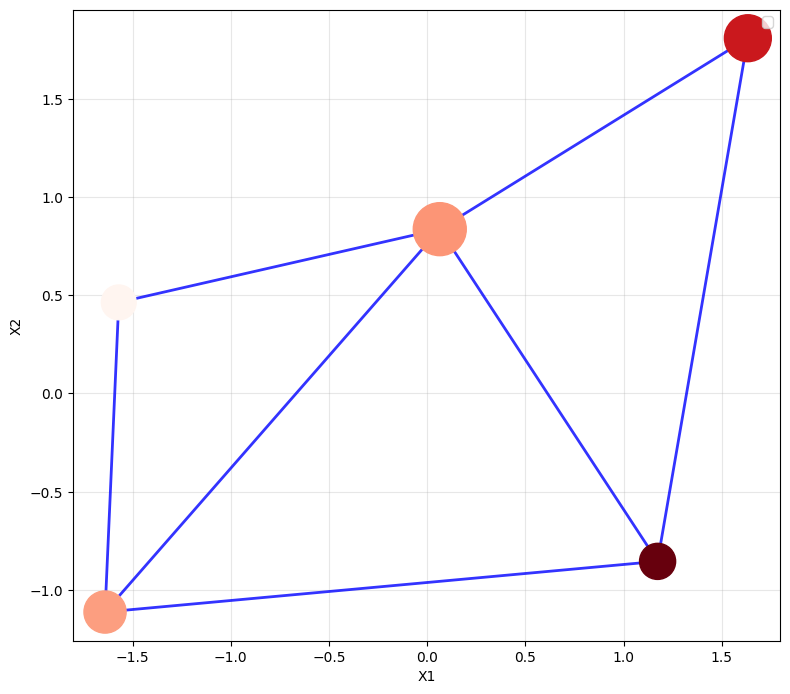

In [1653]:
plt.figure(figsize=(8, 8))

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb2 = list(combinations(circle_centersb2.keys(), 2))
for circle1, circle2 in circle_pairsb2:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centersb2[circle1]
        x2, y2 = circle_centersb2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs2a['X1'], cs2a['X2'], c=cs2a['Y_Mean'], cmap='Reds',s=cs2a['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(True, alpha=0.3)
plt.tight_layout()

plt.savefig('bmsd2m02.png', dpi=300)

Finally remove the axes to leave only the TDABM style structure for Dataset 2

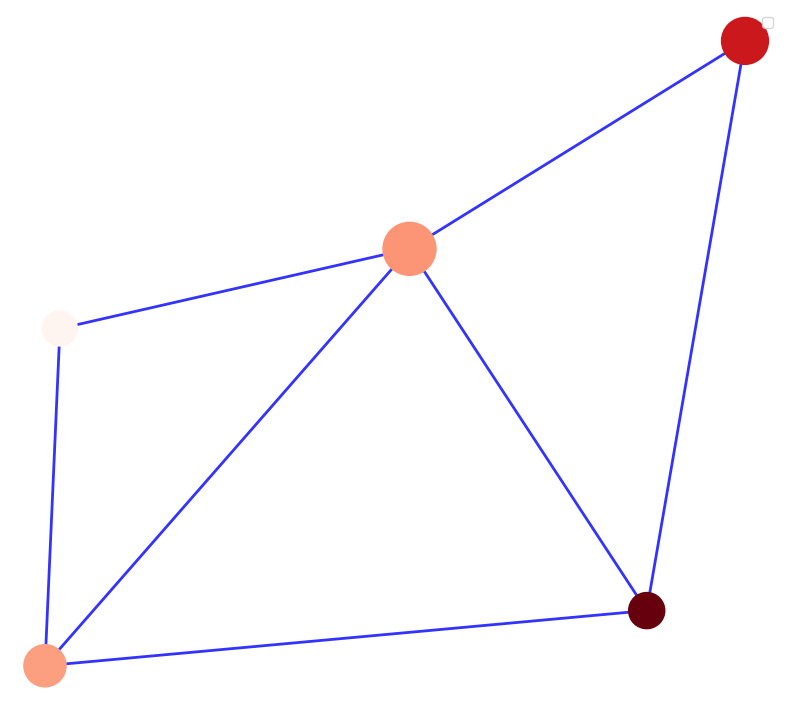

In [1654]:
plt.figure(figsize=(8, 8))

# --- Draw connections between intersecting circles (zorder=4) ---
circle_pairsb2 = list(combinations(circle_centersb2.keys(), 2))
for circle1, circle2 in circle_pairsb2:
    col1 = f"ainside_{circle1}"
    col2 = f"ainside_{circle2}"
    
    # Check for shared points (ensure columns are boolean)
    if (df2[col1].astype(bool) & df2[col2].astype(bool)).any():
        x1, y1 = circle_centersb2[circle1]
        x2, y2 = circle_centersb2[circle2]
        plt.plot([x1, x2], [y1, y2], 'b-', linewidth=2, alpha=0.8, zorder=4)

# Draw circles first (zorder=2)
plt.scatter(cs2a['X1'], cs2a['X2'], c=cs2a['Y_Mean'], cmap='Reds',s=cs2a['Count2'], zorder=5)

# --- Finalize plot ---
plt.xlabel('X1')
plt.ylabel('X2')
plt.title('')
plt.legend('')
plt.gca().set_aspect('equal')
plt.grid(False)
plt.axis('off')
plt.tight_layout()

plt.savefig('bmsd2m03.png', dpi=300)

The two datasets have now been converted into a TDABM style structure. The objects containing the summaries of the circles are kept for comparison with the TDABM information later. 

# Topological Data Analysis Ball Mapper

In this section the TDABM plot for the two datasets is constructed using the python packages. Begin by creating the necessary input dataframes

In [1655]:
xv1 = df1[['X1','X2']]
xv2 = df2[['X1','X2']]

y1 = df1[['Y']]
y2 = df2[['Y']]

The BallMapper function requires three inputs. The X is the data used as the axes, the eps is the radius of the balls and the coloring_df is the variable used for the coloring of the TDABM plot.

In [1656]:
bm1=pbm.BallMapper(X=xv1, eps=1.5, coloring_df=y1)
bm2=pbm.BallMapper(X=xv2, eps=1.5, coloring_df=y2)

/Users/wanlingrudkin/Library/Python/3.9/lib/python/site-packages/pyballmapper/ballmapper.py:292: UserWarning: Warning........... order is not a list or numpy array, using default ordering
  warnings.warn(
/Users/wanlingrudkin/Library/Python/3.9/lib/python/site-packages/pyballmapper/ballmapper.py:292: UserWarning: Warning........... order is not a list or numpy array, using default ordering
  warnings.warn(


To plot the TDABM graph it is necessary to use the networkx package in Python. There are many settings for networkx which are discussed in the next section. Here default settings are used

<Axes: >

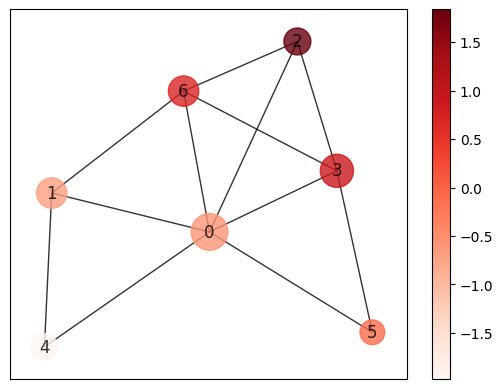

In [1657]:
bm1.draw_networkx(coloring_variable='Y', colorbar=True)

Saving of the output is done manually in this guide. Code can be written to enable the automatic saving of the output.

The plot for the correlated dataset is also constructed in the same way

<Axes: >

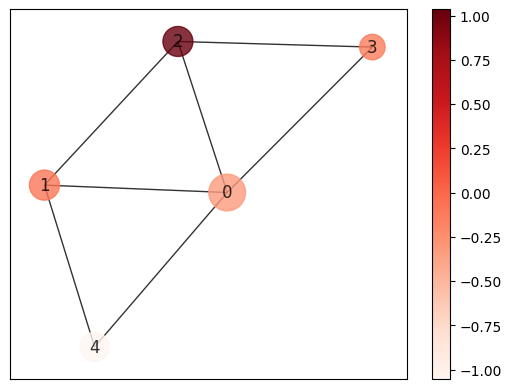

In [1658]:
bm2.draw_networkx(coloring_variable='Y', colorbar=True)

Both plots emphasize that the TDABM graph is abstract. The lowest values of Y are not seen in the bottom right of the space. The relocation of the points may seem unnecessary in two-dimensions, but is inevitable when there are more than 2 axes. Hence this guide is to show that the same intuition results. 

To recover the axis values in TDABM the X variables can be used as the coloration. The following code produces X1 in Dataset 1.

In [1659]:
y3 = df1[['X1']]
y4 = df1[['X2']]
y5 = df2[['X1']]
y6 = df2[['X2']]

For each of the X variables the TDABM plot may be generated

In [1660]:
bm3=pbm.BallMapper(X=xv1, eps=1.5, coloring_df=y3)
bm4=pbm.BallMapper(X=xv1, eps=1.5, coloring_df=y4)
bm5=pbm.BallMapper(X=xv2, eps=1.5, coloring_df=y5)
bm6=pbm.BallMapper(X=xv2, eps=1.5, coloring_df=y6)

/Users/wanlingrudkin/Library/Python/3.9/lib/python/site-packages/pyballmapper/ballmapper.py:292: UserWarning: Warning........... order is not a list or numpy array, using default ordering
  warnings.warn(
/Users/wanlingrudkin/Library/Python/3.9/lib/python/site-packages/pyballmapper/ballmapper.py:292: UserWarning: Warning........... order is not a list or numpy array, using default ordering
  warnings.warn(
/Users/wanlingrudkin/Library/Python/3.9/lib/python/site-packages/pyballmapper/ballmapper.py:292: UserWarning: Warning........... order is not a list or numpy array, using default ordering
  warnings.warn(
/Users/wanlingrudkin/Library/Python/3.9/lib/python/site-packages/pyballmapper/ballmapper.py:292: UserWarning: Warning........... order is not a list or numpy array, using default ordering
  warnings.warn(


The TDABM graphs can then be drawn with the coloring according to the axis variables. First Dataset 1 X1

<Axes: >

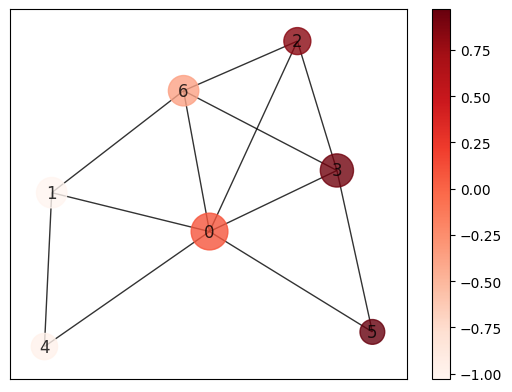

In [1661]:
bm3.draw_networkx(coloring_variable='X1', colorbar=True)

Next Dataset 1 X2

<Axes: >

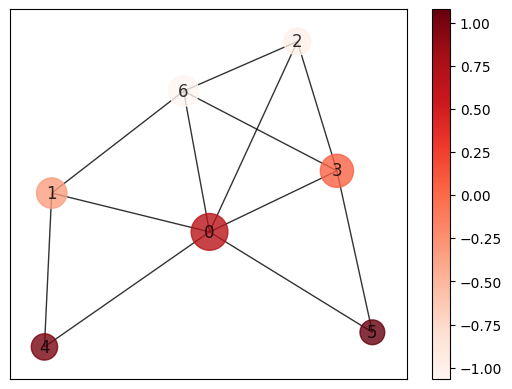

In [1662]:
 bm4.draw_networkx(coloring_variable='X2', colorbar=True)

Then turning to Dataset 2 and starting with X1

<Axes: >

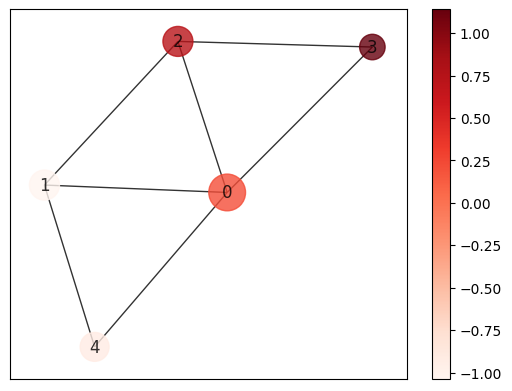

In [1663]:
bm5.draw_networkx(coloring_variable='X1', colorbar=True)

Finally Dataset 2, but this time colored by X2

<Axes: >

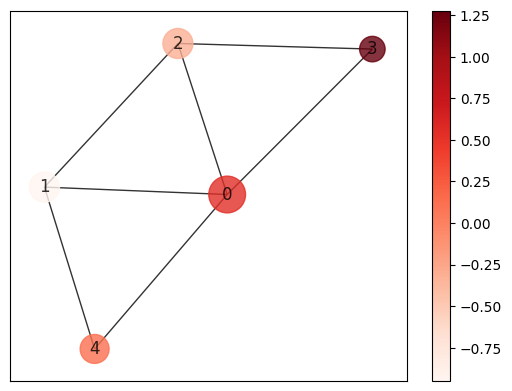

In [1664]:
bm6.draw_networkx(coloring_variable='X2', colorbar=True)

The basic TDABM graphs generated by Python use the red color map. However, the versions generated in R use the rainbow colormap. The coloring can be changed in a straightforward fashion with the color_palette option. 

First obtain the desired colormap

In [1665]:
hsvp = cm.get_cmap("gist_rainbow")

Now generate a new version of the TDABM graph

<Axes: >

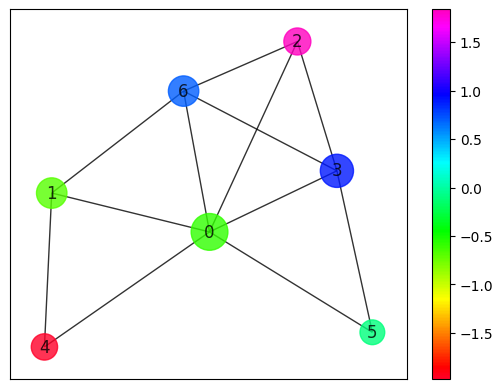

In [1666]:
bm1.draw_networkx(coloring_variable='Y', color_palette=hsvp, colorbar=True)

The Dataset 2 plot can also be recreated

<Axes: >

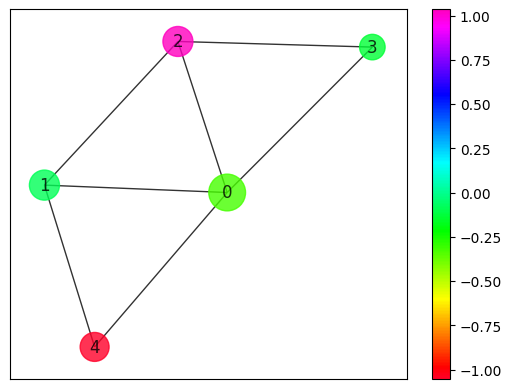

In [1667]:
bm2.draw_networkx(coloring_variable='Y', color_palette=hsvp, colorbar=True)

I also produce rainbow versions of the axis plots for the guide. Again there are 4 combinations of dataset and X. The code starts with Dataset 1 X1

<Axes: >

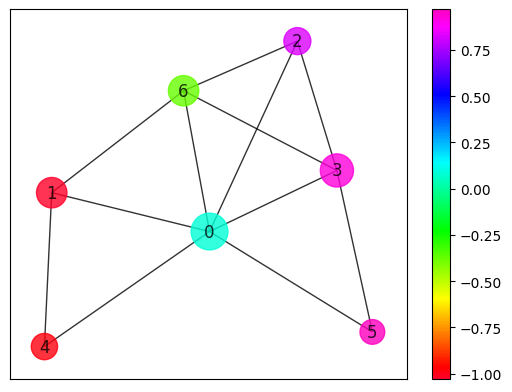

In [1668]:
bm3.draw_networkx(coloring_variable='X1', color_palette=hsvp, colorbar=True)

Next X2 as the coloring variable in Dataset 1

<Axes: >

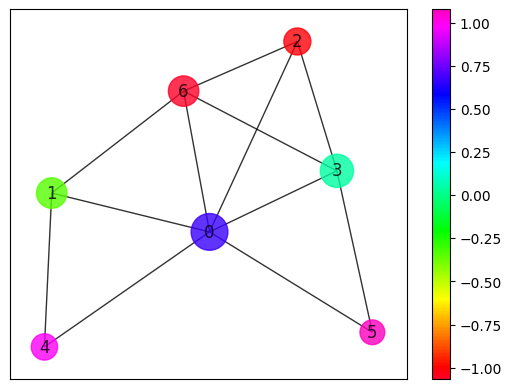

In [1669]:
bm4.draw_networkx(coloring_variable='X2', color_palette=hsvp, colorbar=True)

Then Dataset 2 X1

<Axes: >

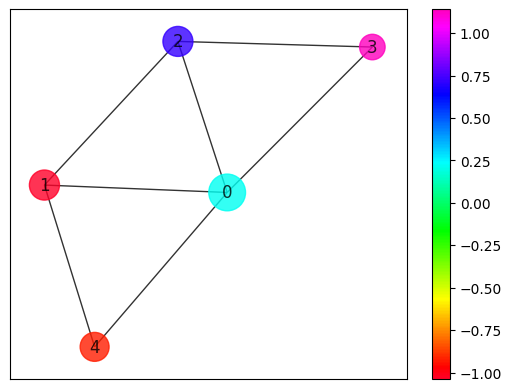

In [1670]:
bm5.draw_networkx(coloring_variable='X1', color_palette=hsvp, colorbar=True)

Finally, Dataset 2 X2

<Axes: >

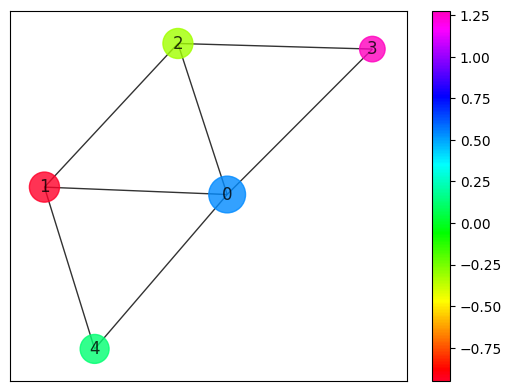

In [1671]:
bm6.draw_networkx(coloring_variable='X2', color_palette=hsvp, colorbar=True)

There are settings

<Axes: >

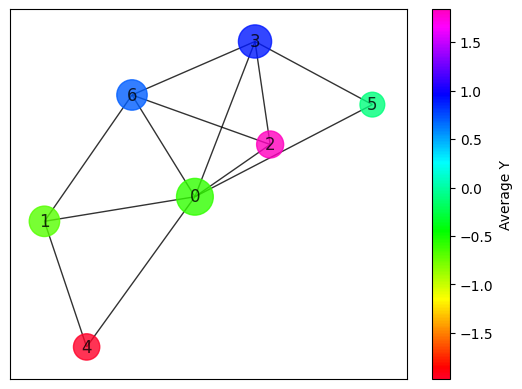

In [1672]:
bm1.draw_networkx(coloring_variable='Y', color_palette=hsvp, colorbar=True, colorbar_label="Average Y", pos=nx.spring_layout(bm1.Graph, k=0.3, seed=1))

<Axes: >

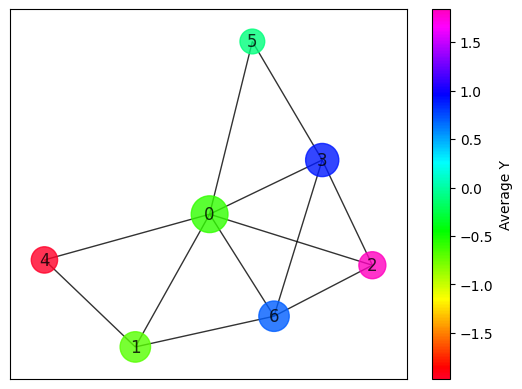

In [1673]:
bm1.draw_networkx(coloring_variable='Y', color_palette=hsvp, colorbar=True, colorbar_label="Average Y", pos=nx.spring_layout(bm1.Graph, k=0.3, seed=5))

<Axes: >

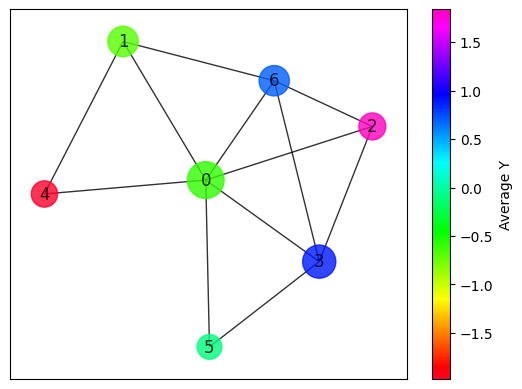

In [1674]:
bm1.draw_networkx(coloring_variable='Y', color_palette=hsvp, colorbar=True, colorbar_label="Average Y", pos=nx.spring_layout(bm1.Graph, k=1, seed=5))

First use the points_and_balls function to get information about which points are in each ball

In [1675]:
df2['point'] = df2.index
bm1a = bm1.points_and_balls()
bm2a = bm2.points_and_balls()

Merge the generated list of points and balls

In [1676]:
df1a = pd.merge(df1,bm1a,on="point")
df2a = pd.merge(df2,bm2a,on="point")

View only the members of ball 0. Using describe() prints the full set of summary statistics for the ball.

In [1677]:
bm1b0 = df1a[df1a["ball"] == 0]

bm1b0.describe()

,X1,X2,Y,point,distance01,ainside_circle01,circle_membershipa,distance02,ainside_circle02,distance03,ainside_circle03,distance04,ainside_circle04,distance05,ainside_circle05,distance06,ainside_circle06,distance07,ainside_circle07,ball
count,485.000000,485.000000,485.000000,485.000000,485.000000,485.0,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.0
mean,0.085166,0.671678,-0.586512,497.616495,0.951003,1.0,7.610309,2.119391,0.206186,2.681426,0.030928,1.626431,0.447423,1.938160,0.298969,1.803367,0.303093,2.502815,0.061856,0.0
std,0.771673,0.617047,0.994752,289.014415,0.369175,0.0,1.606642,0.693499,0.404983,0.654918,0.173301,0.680515,0.497741,0.742586,0.458279,0.696742,0.460070,0.626761,0.241142,0.0
min,-1.429068,-0.530527,-2.767637,0.000000,0.000000,1.0,1.000000,0.652974,0.000000,1.335345,0.000000,0.146904,0.000000,0.303634,0.000000,0.068583,0.000000,1.204240,0.000000,0.0
25%,-0.536858,0.169195,-1.310230,245.000000,0.671783,1.0,8.000000,1.616278,0.000000,2.183800,0.000000,1.121449,0.000000,1.364386,0.000000,1.370333,0.000000,1.990496,0.000000,0.0
50%,0.078993,0.707517,-0.505236,500.000000,0.966889,1.0,8.000000,2.116845,0.000000,2.697115,0.000000,1.612154,0.000000,1.998585,0.000000,1.889418,0.000000,2.521623,0.000000,0.0
75%,0.683434,1.197237,0.200477,735.000000,1.276742,1.0,8.000000,2.626218,0.000000,3.209093,0.000000,2.140938,1.000000,2.542822,1.000000,2.321081,1.000000,3.036533,0.000000,0.0
max,1.541579,1.734093,1.254515,999.000000,1.499378,1.0,8.000000,3.581707,1.000000,4.017411,1.000000,3.030735,1.000000,3.155354,1.000000,3.018280,1.000000,3.756610,1.000000,0.0


A set of summary statistics can be produced by first generating the individual stats and combining into a data frame. Alternatively, the user may apply a function to the merged dataframe to produce a commonly constructed set of statistics. This guide leaves such construction to the user

In [1678]:
X1m = df1a.groupby('ball')['X1'].mean()
X1s = df1a.groupby('ball')['X1'].std()
X1min = df1a.groupby('ball')['X1'].min()
X1max = df1a.groupby('ball')['X1'].max()
X2m = df1a.groupby('ball')['X2'].mean()
X2s = df1a.groupby('ball')['X2'].std()
X2min = df1a.groupby('ball')['X2'].min()
X2max = df1a.groupby('ball')['X2'].max()
Ym = df1a.groupby('ball')['Y'].mean()
Ys = df1a.groupby('ball')['Y'].std()
Ymin = df1a.groupby('ball')['Y'].min()
Ymax = df1a.groupby('ball')['Y'].max()
nobs = df1a.groupby('ball')['Y'].count()

ballmeans1 = pd.DataFrame([X1m,X1s,X1min,X1max,X2m,X2s,X2min,X2max,Ym,Ys,Ymin,Ymax,nobs])
ballmeans1 = ballmeans1.transpose()

ballmeans1

,X1,X1,X1,X1,X2,X2,X2,X2,Y,Y,Y,Y,Y
ball,,,,,,,,,,,,,
0,0.085166,0.771673,-1.429068,1.541579,0.671678,0.617047,-0.530527,1.734093,-0.586512,0.994752,-2.767637,1.254515,485.0
1,-1.027761,0.437902,-1.738016,-0.180371,-0.339712,0.745976,-1.747784,1.112899,-0.688049,0.879987,-2.783810,0.810661,307.0
2,0.826005,0.554375,-0.314087,1.747614,-1.012453,0.453563,-1.747682,-0.181629,1.838458,0.613951,0.758870,3.399659,225.0
3,0.930916,0.505172,-0.082255,1.753001,0.043641,0.749939,-1.450549,1.486935,0.887275,0.893460,-0.687278,3.086385,380.0
4,-0.984988,0.487194,-1.738016,-0.111738,0.991111,0.450512,0.002004,1.706813,-1.976098,0.586937,-3.243551,-0.915089,209.0
5,0.971351,0.492133,-0.069442,1.753001,1.076012,0.407445,0.293816,1.734093,-0.104661,0.697472,-1.733798,1.364571,176.0
6,-0.372701,0.723022,-1.736177,1.059182,-1.065220,0.414291,-1.749409,-0.194701,0.692519,0.856921,-0.814435,2.639082,306.0


The generation of the summary statistics can now be generated for Dataset 2

In [1679]:
X1m = df2a.groupby('ball')['X1'].mean()
X1s = df2a.groupby('ball')['X1'].std()
X1min = df2a.groupby('ball')['X1'].min()
X1max = df2a.groupby('ball')['X1'].max()
X2m = df2a.groupby('ball')['X2'].mean()
X2s = df2a.groupby('ball')['X2'].std()
X2min = df2a.groupby('ball')['X2'].min()
X2max = df2a.groupby('ball')['X2'].max()
Ym = df2a.groupby('ball')['Y'].mean()
Ys = df2a.groupby('ball')['Y'].std()
Ymin = df2a.groupby('ball')['Y'].min()
Ymax = df2a.groupby('ball')['Y'].max()
nobs = df2a.groupby('ball')['Y'].count()
 

ballmeans2 = pd.DataFrame([X1m,X1s,X1min,X1max,X2m,X2s,X2min,X2max,Ym,Ys,Ymin,Ymax,nobs])
ballmeans2 = ballmeans2.transpose()

ballmeans2

,X1,X1,X1,X1,X2,X2,X2,X2,Y,Y,Y,Y,Y
ball,,,,,,,,,,,,,
0,0.214548,0.727056,-1.412091,1.551513,0.539811,0.590100,-0.614167,1.937462,-0.325263,0.833887,-2.168099,1.309443,503.0
1,-1.037986,0.448958,-1.738016,-0.157176,-0.950363,0.644849,-2.334987,0.374766,-0.087623,0.802540,-2.006596,1.272976,309.0
2,0.718321,0.548569,-0.321655,1.747614,-0.317037,0.548269,-1.541664,0.596840,1.035358,0.557921,-0.057871,2.338708,307.0
3,1.140365,0.400973,0.253638,1.753001,1.272385,0.494357,0.355011,2.307972,-0.132020,0.618713,-1.277854,1.222581,199.0
4,-0.926864,0.474452,-1.738016,-0.103674,0.125782,0.547665,-1.025705,1.294296,-1.052646,0.588612,-2.240476,0.029263,280.0


This is the end of the guide code. There are many more options to explore and it is recommended to continue playing with the plotting functions to understand what happens when the various parameters are changed. 

I hope that this code is useful in the application of TDABM to your data